In [205]:
# General
import pandas as pd
import numpy as np

# Deep learning
import tensorflow as tf

# NLP
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import NearestNeighbors

# Data Analysis
from spacy.tokenizer import Tokenizer
from collections import Counter

from scipy import stats

import sklearn
from sklearn.preprocessing import StandardScaler

import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA

# Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

# Regular Expression
import re
import spacy

# Viz
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline

# Warnings OFF
import warnings
warnings.filterwarnings('ignore')

In [2]:
# DataFrame 불러오기
df = pd.read_csv("./dataset/Agora.csv", encoding="latin1")

# 결과 확인
df.head()

,Vendor,Category,Item,Item Description,Price,Origin,Destination,Rating,Remarks
0,CheapPayTV,Services/Hacking,12 Month HuluPlus gift Code,12-Month HuluPlus Codes for $25. They are wort...,0.05027025666666667 BTC,Torland,NaN,4.96/5,NaN
1,CheapPayTV,Services/Hacking,Pay TV Sky UK Sky Germany HD TV and much mor...,Hi we offer a World Wide CCcam Service for En...,0.152419585 BTC,Torland,NaN,4.96/5,NaN
2,KryptykOG,Services/Hacking,OFFICIAL Account Creator Extreme 4.2,Tagged Submission Fix Bebo Submission Fix Adju...,0.007000000000000005 BTC,Torland,NaN,4.93/5,NaN
3,cyberzen,Services/Hacking,VPN > TOR > SOCK TUTORIAL,How to setup a VPN > TOR > SOCK super safe enc...,0.019016783532494728 BTC,NaN,NaN,4.89/5,NaN
4,businessdude,Services/Hacking,Facebook hacking guide,. This guide will teach you how to hack Faceb...,0.062018073963963936 BTC,Torland,NaN,4.88/5,NaN


In [3]:
# 칼럼에서 공백제거
df.columns = df.columns.str.strip()

# # 결과 확인
# df.columns

In [4]:
# 소문자화할 칼럼 선택
columns_to_lowercase = ['Origin', 'Destination']

# 선택한 칼럼에 대해 소문자화 적용
df[columns_to_lowercase] = df[columns_to_lowercase].apply(lambda x: x.str.lower())

In [5]:
df.duplicated().sum()

0

In [6]:
# 'Price' 칼럼의 이름을 'PriceBTC'로 변경
df.rename(columns={'Price': 'PriceBTC'}, inplace=True)

# 'PriceBTC' 칼럼에서 숫자와 소수점을 제외한 모든 문자 제거
df['PriceBTC'] = df['PriceBTC'].str.replace('[^0-9.]', '', regex=True)

# 결과를 숫자형으로 변환
df['PriceBTC'] = pd.to_numeric(df['PriceBTC'], errors='coerce')

# Pandas 디스플레이 옵션 설정
pd.set_option('display.float_format', '{:.10f}'.format)

# # 결과 확인
# df['PriceBTC']

In [7]:
# 데이터프레임 카피
df_copy = df.copy()

In [8]:
# 'Category' 칼럼의 'Information'을 'Info'로 변경
df_copy['Category'] = df_copy['Category'].replace('Information', 'Info', regex=True)

In [9]:
# 'Origin' 칼럼에서 NaN 값을 무시하고 'btc'로 끝나는 행 찾기
btc_rows = df_copy['Origin'].str.endswith('btc', na=False)

# # 확인
# btc_rows[btc_rows==True]

# 해당하는 행에 대해 칼럼 값 이동
for index, row in df_copy[btc_rows].iterrows():
    df_copy.at[index, 'PriceBTC'] = row['Origin']
    df_copy.at[index, 'Origin'] = row['Destination']
    df_copy.at[index, 'Destination'] = row['Rating']
    df_copy.at[index, 'Rating'] = row['Remarks']
    df_copy.at[index, 'Remarks'] = None  # 'Remarks' 칼럼은 빈 값으로 설정

# 'PriceBTC' 칼럼에서 숫자와 소수점을 제외한 모든 문자 제거
df_copy.loc[btc_rows, 'PriceBTC'] = df_copy.loc[btc_rows, 'PriceBTC'].str.replace('[^0-9.]', '', regex=True)

# 결과를 숫자형으로 변환
df_copy.loc[btc_rows, 'PriceBTC'] = pd.to_numeric(df_copy.loc[btc_rows, 'PriceBTC'], errors='coerce')

# # 결과 확인
# df_copy[df_copy.PriceBTC.isnull()]

# # 결과 적용
# df = df_copy

In [10]:
# 'Item Description' 칼럼에서 NaN 값을 무시하고 'BTC'로 끝나는 행 찾기
btc_rows = df_copy['Item Description'].str.endswith('BTC', na=False) & df_copy['PriceBTC'].isna()
btc_rows[btc_rows==True]


# 해당하는 행에 대해 칼럼 값 이동
for index, row in df_copy[btc_rows].iterrows():
    df_copy.at[index, 'Item Description'] = None
    df_copy.at[index, 'PriceBTC'] = row['Item Description']
    df_copy.at[index, 'Destination'] = None
    df_copy.at[index, 'Rating'] = row['Destination']

# 'PriceBTC' 칼럼에서 숫자와 소수점을 제외한 모든 문자 제거
df_copy.loc[btc_rows, 'PriceBTC'] = df_copy.loc[btc_rows, 'PriceBTC'].str.replace('[^0-9.]', '', regex=True)

# 결과를 숫자형으로 변환
df_copy.loc[btc_rows, 'PriceBTC'] = pd.to_numeric(df_copy.loc[btc_rows, 'PriceBTC'], errors='coerce')

# # 결과 확인
# df[df.PriceBTC.isnull()]

In [11]:
### value Count가 1인 Category 삭제 >> Vendor or Price에 대한 정보 없음.

# 'Category' 칼럼의 value counts 계산
value_counts = df_copy['Category'].value_counts()

# value count가 1보다 큰 값들만 필터링
to_keep = value_counts[value_counts > 1].index.tolist()

# 필터링된 카테고리만 포함하는 행들만 선택
df_copy = df_copy[df_copy['Category'].isin(to_keep)]

# 인덱스 재정렬
df_copy.reset_index(drop=True, inplace=True)

# # 결과 출력
# value_counts = df_copy['Category'].value_counts()
# value_counts[value_counts == 1]


In [12]:
### 'Rating' 전처리 

# Rating 칼럼에서 숫자 추출 및 형식 조정
def extract_rating(rating):
    if pd.isna(rating):
        return None
    if isinstance(rating, str) and 'deal' in rating:
        return None
    try:
        # 숫자 추출
        match = re.search(r'(\d+(\.\d+)?)', str(rating))
        if match:
            return float(match.group(1))
        else:
            return None
    except TypeError:
        return None

df_copy['Rating'] = df_copy['Rating'].apply(extract_rating)

# 5보다 높은 숫자 삭제
df_copy.loc[df_copy['Rating'] > 5.0, 'Rating'] = np.nan

# # 결과 확인
# print(df['Rating'])

In [13]:
# import pandas as pd
# import pycountry

# df_copy = df.copy()

# # 국가명을 국가코드로 변환하는 함수
# def country_name_to_country_alpha2(country_name):
#     try:
#         return pycountry.countries.get(name=country_name).alpha_2
#     except:
#         return None

# # Origin과 Destination 칼럼을 국가코드로 변환
# df_copy['Origin'] = df['Origin'].apply(country_name_to_country_alpha2)
# df_copy['Destination'] = df['Destination'].apply(country_name_to_country_alpha2)

# # 결과 확인
# print(df_copy[['Origin', 'Destination']])


In [14]:
### 'Origin'과 'Destination' 텍스트 전처리

# # 소문자화할 칼럼 선택
# columns_to_lowercase = ['Origin', 'Destination']

# # 선택한 칼럼에 대해 소문자화 적용
# df[columns_to_lowercase] = df[columns_to_lowercase].apply(lambda x: x.str.lower())


# 특수 문자 제거, 특정 단어 제거, 두 번 연속되는 공백을 한 번의 공백으로 변환하는 함수
def clean_text(text):
    if pd.isna(text) or not isinstance(text, str):
        return text
    text = text.strip()
    # 'only', 'and', 'some', 'others', 'other' 제거
    text = re.sub(r'\b(only|and|some|others|other)\b', ' ', text)
    ## 'and' 제거
    # text = re.sub(r'and', ' ', text)
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text.lower())  # 특수 문자 제거 & 소문자화
    text = re.sub(r'\s\s+', ' ', text)  # 두 번 연속되는 공백을 한 번의 공백으로 변환
    return text.strip()

# 'Origin'과 'Destination' 칼럼 정리
df_copy['Origin'] = df_copy['Origin'].apply(clean_text)
df_copy['Destination'] = df_copy['Destination'].apply(clean_text)

# 동의어 매핑 생성
location_mapping = {
    'us': 'usa',
    'america': 'usa',
    'world': 'worldwide',
    'united states' : 'usa',
    'torland' : 'internet',
    'europe union' : 'eu',
    'torlandnz' : 'internet',
    'united states of america' : 'usa',
    'global' : 'worldwide',
    'worldwide international': 'worldwide',
    'europe germany' : 'eu',
    'germany eu' : 'eu',
    'uk eu' : 'eu',
    'united kingdom' : 'uk',
    'you' : 'worldwide',
    'germany europe' : 'eu',
    'unitedkingdom' : 'uk',
    'worldwide on request' : 'worldwide',
    'anywhere' : 'worldwide',
    'international worldwide' : 'worldwide',
    'europe' : 'eu',
    'world wide': 'worldwide',
    'everywhere': 'worldwide',
    'european union': 'eu',
    'international': 'worldwide',
    'wordwide': 'worldwide',
    'worlwide': 'worldwide',
    'no restrictions': 'worldwide',
    'ww': 'worldwide',
    'wideworld': 'worldwide',
    'us domestic': 'usa',
    'germany and europe': 'eu',
    'europe and germany': 'eu',
    'europe norway swizz' : 'eu',
    'finland and eu': 'eu',
    'eu countries': 'eu',
    'woldwide': 'worldwide',
    'everywhere worldwide any destination ': 'worldwide',
    'all': 'worldwide',
    'every where': 'worldwide',
    'internationally': 'worldwide',
    'wolrdwide': 'worldwide',
    'europa': 'eu',
    'europe for the moment': 'eu',
    'free worldwide': 'worldwide',
    'world mars jupiter': 'worldwide',
    'beta worldwide': 'worldwide',
    'international worldwide shipping': 'worldwide',
    'worldwide upon request': 'worldwide',
    'universe': 'worldwide',
    'european countries': 'eu',
    'worldwide free super stealth': 'worldwide',
    'w o r l d w i d e': 'worldwide',
    'universal': 'worldwide',
    'wordlwide': 'worldwide',
    'worldwiede': 'worldwide',
    'worldide': 'worldwide',
    'worldd': 'worldwide',
    'wide': 'worldwide',
    'worldwide w tracking': 'worldwide',
    'worldiwde': 'worldwide',
    'worldwid': 'worldwide',
    'earth': 'worldwide',
    'wrol': 'worldwide',
    'usa uk worldwide' : 'worldwide',
    'theunitedsnakes' : 'usa',
    'ww shipping' : 'worldwide',
    'europe uk' : 'eu',
    'eu scandinavia fe' : 'eu',
    'aus' : 'australia',
    'worldwide eu scandinavia' : 'worldwide',
    'euuk' : 'eu',
    'uk europe' : 'eu',
    'uk euro worldwide' : 'worldwide',
    'finland eu' : 'eu',
    'to europe' : 'eu',
    'eugermany' : 'eu',
    'swiss eu' : 'eu',
    'ukeu' : 'eu',
    'worldwide see profile' : 'worldwide',
    'europe switzerland norway' : 'eu',
    'domestic usa' : 'usa',
    'uk ask' : 'uk',
    'scandinaviaeurope' : 'eu',
    'germany europe schweiz' : 'eu',
    'of captivity to the human race' : 'worldwide',
    'scandinavia ww' : 'worldwide',
    'anywhere man' : 'worldwide',
    'worldwide prior' : 'worldwide',
    'ukeurope' : 'eu',
    'worldwide any destination everywhere' : 'worldwide',
    'uk ire' : 'uk',
    'eu uk' : 'eu',
    'the united snakes of captivity' : 'usa',
    'ukeurope' : 'eu',
    'worldwide to usa uk worldwide' : 'worldwide',
    'imgclassflagimgsrcimagesflagw13auspng' : 'australia',
    'agora' : 'internet',
    'germany germany' : 'germany',
    'usa worldwide' : 'usa',
    'usa man' : 'usa',


    'united states amp canada ' : 'usa and canada',
    'united states canada ' : 'usa and canada',
    'european union uk worldwide' : 'worldwide',
    'hong kong china' : 'china',
    'hongkong' : 'china',
    'hong kong' : 'china',
    'hong' : 'china'
    # 추가적인 매핑을 추가
}

# Destination 및 Origin 칼럼 변환 함수
def standardize_location(location):
    return location_mapping.get(location, location)

# 칼럼에 매핑 적용
df_copy['Destination'] = df_copy['Destination'].map(standardize_location)
df_copy['Origin'] = df_copy['Origin'].map(standardize_location)

# # 결과 확인
# print(df_copy['Destination'].value_counts())
# print(df_copy['Origin'].value_counts())

In [15]:
### 'Item'과 'Item Description' 텍스트 전처리

# Spacy의 영어 불용어 목록 로드
nlp = spacy.load('en_core_web_sm')
stopwords = nlp.Defaults.stop_words.union([]) # 여기에 추가적인 불용어를 추가할 수 있습니다.

# 화폐 기호를 단어로 변환하는 함수
def replace_currency_symbols(text):
    currency_symbols = {
        '$': 'dollar',
        '€': 'euro',
        '£': 'pound'
    }
    for symbol, word in currency_symbols.items():
        text = re.sub(rf'(\d+){re.escape(symbol)}', r'\1' + word, text) # 숫자 뒤에 기호
        text = re.sub(rf'{re.escape(symbol)}(\d+)', r'\1' + word, text) # 기호 앞에 숫자
    return text

# 숫자 앞뒤 및 사이의 공백 제거
def remove_spaces_around_numbers(text):
    # # 숫자 앞뒤의 공백 제거
    # text = re.sub(r'\s+(\d+)', r'\1', text)
    # text = re.sub(r'(\d+)\s+', r'\1', text)
    # 숫자 사이의 공백 제거
    text = re.sub(r'(\d+)\s+(\d+)', r'\1\2', text)
    return text

# 텍스트 전처리 함수
def preprocess_text(text):
    if not isinstance(text, str):
        return text
    
    # 링크 주소 삭제
    text = re.sub(r'https?:\/\/\S+', '', text)
    # 화폐 기호 처리
    text = replace_currency_symbols(text)
    # 숫자와 숫자 사이의 점만 유지
    text = re.sub(r'(\d)\.(\d)', r'\1.\2', text)
    # 특수 문자 및 알파벳이 아닌 기호 제거 (소수점 유지)
    text = re.sub(r'[^a-zA-Z0-9.\s]', ' ', text)
    # 두 칸 이상의 공백을 한 칸으로 변환
    text = re.sub(r'\s\s+', ' ', text)
    # 소문자화
    text = text.lower()
    # 불용어 제거
    text = ' '.join([word for word in text.split() if word not in stopwords])
    # # 숫자 관련 공백 처리
    # text = remove_spaces_around_numbers(text)
    
    return text.strip()

# 'Item'과 'Item Description' 칼럼에 텍스트 전처리 적용
df_copy['Item'] = df['Item'].apply(preprocess_text)
df_copy['Item Description'] = df['Item Description'].apply(preprocess_text)

In [16]:
# 지정된 키워드 중 하나라도 포함하는 조건
keywords = ['lsd', 'cocaine', 'kg', 'kilogram', 'kilograms', 'kilo']
condition_keywords = df_copy['Item'].str.contains('|'.join(keywords), case=False, na=False)

# PriceBTC가 200 이상이지만, 위 키워드를 포함하지 않는 조건
condition_delete = (~condition_keywords) & (df_copy['PriceBTC'] >= 200)

# 조건에 해당하는 행 삭제
df_copy = df_copy[~condition_delete]

# PriceBTC가 0.0015 이하인 행 삭제 (광고성 문구가 많음)
df_copy = df_copy[df_copy['PriceBTC'] >0.0015]

# PriceBTC 2800 이상인 행 삭제 (물폼의 종류,양에 비해 지나치게 비쌈)
df_copy = df_copy[df_copy['PriceBTC'] < 2800]

# 'Drugs/Cannabis/Concentrates' 카테고리에서 'PriceBTC'가 35 이상인 행 삭제
df_copy = df_copy[~((df_copy['Category'] == 'Drugs/Cannabis/Concentrates') & (df_copy['PriceBTC'] >= 35))]

# 'Drugs/Cannabis/Weed' 카테고리에서 'PriceBTC'가 125 이상인 행 삭제
df_copy = df_copy[~((df_copy['Category'] == 'Drugs/Cannabis/Weed') & (df_copy['PriceBTC'] >= 125))]

# PriceBTC 열을 float 타입으로 변환
df_copy['PriceBTC'] = pd.to_numeric(df_copy['PriceBTC'], errors='coerce')

# 인덱스 재설정
df_copy.reset_index(drop=True, inplace=True)

In [17]:
# ### 통계적 트리밍

# # 토큰화 함수
# def tokenize(text):
#     return text.split()

# # 칼럼 토큰화
# item_tokens = df_copy['Item'].dropna().apply(tokenize).sum()
# item_desc_tokens = df_copy['Item Description'].dropna().apply(tokenize).sum()

# # 토큰 빈도 계산
# item_freq = Counter(item_tokens)
# item_desc_freq = Counter(item_desc_tokens)

# # 누적 분포 그래프를 위한 빈도 데이터 준비
# def prepare_cumulative_distribution(freq):
#     total = sum(freq.values())
#     cumulative = 0
#     word_rank = []
#     cumulative_percentage = []

#     for word, count in freq.most_common():
#         cumulative += count
#         word_rank.append(word)
#         cumulative_percentage.append(cumulative / total)

#     return word_rank, cumulative_percentage

# # 누적 분포 데이터
# item_rank, item_cumulative = prepare_cumulative_distribution(item_freq)
# item_desc_rank, item_desc_cumulative = prepare_cumulative_distribution(item_desc_freq)

In [18]:
# # 데이터 확인
# print("Item Cumulative Distribution Length:", len(item_cumulative))
# print("Item Description Cumulative Distribution Length:", len(item_desc_cumulative))

# # 첫 번째와 마지막 데이터 포인트 출력 (예시 확인)
# print("First and Last Data Points for Item:", item_cumulative[:1], item_cumulative[-1:])
# print("First and Last Data Points for Item Description:", item_desc_cumulative[:1], item_desc_cumulative[-1:])


Item Cumulative Distribution Length: 24592
Item Description Cumulative Distribution Length: 52541
First and Last Data Points for Item: [0.016964421548126517] [1.0]
First and Last Data Points for Item Description: [0.04112913397744759] [1.0]


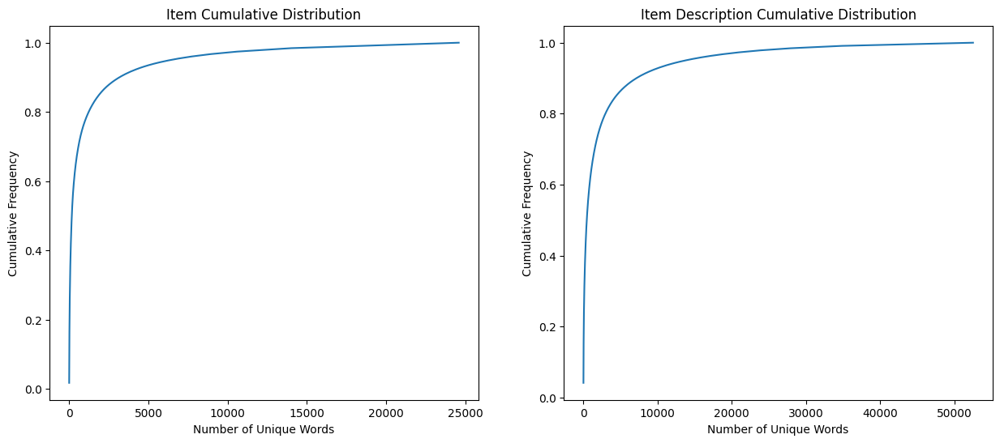

In [19]:
# # 그래프 그리기
# plt.figure(figsize=(15, 6))

# plt.subplot(1, 2, 1)
# plt.plot(item_cumulative)
# plt.title('Item Cumulative Distribution')
# plt.xlabel('Number of Unique Words')
# plt.ylabel('Cumulative Frequency')

# plt.subplot(1, 2, 2)
# plt.plot(item_desc_cumulative)
# plt.title('Item Description Cumulative Distribution')
# plt.xlabel('Number of Unique Words')
# plt.ylabel('Cumulative Frequency')

# plt.show()

In [21]:
# # 빈도가 1% 이상인 단어 선택
# one_percent_item = int(len(item_freq) * 0.01)
# one_percent_item_desc = int(len(item_desc_freq) * 0.01)

# selected_item_words = set(word for word, freq in item_freq.most_common(one_percent_item))
# selected_item_desc_words = set(word for word, freq in item_desc_freq.most_common(one_percent_item_desc))

# print("Selected words from 'Item':", selected_item_words)
# print("Selected words from 'Item Description':", selected_item_desc_words)


Selected words from 'Item': {'tablets', 'fishscale', 'strong', 'clean', 'organic', 'limited', 'shatter', 'widow', 'eu', '100mg', 'gr', 'w', 'marijuana', '3.5', 'amnesia', 'xanax', '1', 'xtc', '10mg', '10ml', 'fast', 'potent', '112g', 'medical', 'x', 'domestic', 'dream', 'ml', 'express', 'yellow', '200mg', 'haze', 'ounce', 'original', 'ecstasy', '30', '7g', '90', 'purity', 'buds', 'sativa', 'bho', 'ir', 'red', 'valium', '100x', 'cubensis', 'special', 'pill', 'half', 'guide', '14', 'early', 'post', 'crystals', '1oz', '20mg', '0.5g', 'bud', 'lifetime', 'custom', 'tabs', 'diesel', 'capsules', 'cookies', 'meth', '50g', 'tramadol', 'crystal', 'qp', '500g', '5mg', '70', 'tab', '2', 'fire', 'kush', 'escrow', '5g', '4', '5x', '10x', 'usa', 'seeds', '50x', 'adderall', 'tested', 'hydro', 'delivery', '3g', 'gold', '250', 'outdoor', 'silver', '10', '250mg', 'bars', 'dutch', 'colombian', '5', 'viagra', 'mushrooms', 'lemon', 'strain', 'amphetamine', 'uncut', 'weed', '500', 'account', 'oil', '500mg', 

In [157]:
df_copy.head()

,Vendor,Category,Item,Item Description,PriceBTC,Origin,Destination,Rating,Remarks,Level1,Level2,Level3
0,CheapPayTV,Services/Hacking,12 month huluplus gift code,12 month huluplus codes 25dollar. worth 95doll...,0.0502702567,internet,NaN,4.9600000000,NaN,Services,Hacking,None
1,CheapPayTV,Services/Hacking,pay tv sky uk sky germany hd tv more.. cccam s...,hi offer world wide cccam service enigma 2 dev...,0.1524195850,internet,NaN,4.9600000000,NaN,Services,Hacking,None
2,KryptykOG,Services/Hacking,official account creator extreme 4.2,tagged submission fix bebo submission fix adju...,0.0070000000,internet,NaN,4.9300000000,NaN,Services,Hacking,None
3,cyberzen,Services/Hacking,vpn tor sock tutorial,setup vpn tor sock super safe encrypted connec...,0.0190167835,NaN,NaN,4.8900000000,NaN,Services,Hacking,None
4,businessdude,Services/Hacking,facebook hacking guide,. guide teach hack facebook accounts ex friend...,0.0620180740,internet,NaN,4.8800000000,NaN,Services,Hacking,None


In [164]:
df_copy.iloc[:,:7].describe(include='all')

,Vendor,Category,Item,Item Description,PriceBTC,Origin,Destination
count,108692,108692,108692,108665,108692.0000000000,98978,60093
unique,3183,104,103719,68070,NaN,314,689
top,optiman,Drugs/Cannabis/Weed,custom,terms conditions read profile page ordering ch...,NaN,usa,worldwide
freq,874,21201,45,291,NaN,33493,23561
mean,NaN,NaN,NaN,NaN,2.1039918797,NaN,NaN
std,NaN,NaN,NaN,NaN,12.5947108731,NaN,NaN
min,NaN,NaN,NaN,NaN,0.0015037500,NaN,NaN
25%,NaN,NaN,NaN,NaN,0.1245574060,NaN,NaN
50%,NaN,NaN,NaN,NaN,0.3826712086,NaN,NaN
75%,NaN,NaN,NaN,NaN,1.3121418382,NaN,NaN


In [161]:
df_copy.PriceBTC.isna().sum()

0

In [22]:
######### 전처리 끝 ###########################

In [23]:
######### 적용 ##############################

df = df_copy

###########################################

In [24]:
######### 통계분석 ###########################

In [25]:
from ydata_profiling import ProfileReport

# data report
profile = ProfileReport(df_copy, minimal=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [247]:
# Vendor별 Total Sales (TS) 계산
total_sales = df_copy.groupby('Vendor')['PriceBTC'].sum()

# Vendor별 Number of Items (NoI) 계산
number_of_items = df_copy.groupby('Vendor').size()

# Vendor별 평균 Rating 계산
average_rating = df_copy.groupby('Vendor')['Rating'].mean()

# Vendor별 Number of Categories (NoC) 계산
number_of_categories = df_copy.groupby('Vendor')['Category'].nunique()

# 새로운 데이터프레임 생성
vendor_df = pd.DataFrame({
    'Vendor': total_sales.index,
    'TS': total_sales.values,
    'NoI': number_of_items.values,
    'Rating': average_rating.values,
    'NoC': number_of_categories.values
})

# Rating 열의 null 값들을 나머지 Rating 값들의 평균으로 채우기
vendor_df['Rating'] = vendor_df['Rating'].fillna(vendor_df['Rating'].mean())

vendor_df['Rating'] = vendor_df['Rating'] + 1 # 제곱근 변환시에 1 이하 값 계산 / 로그변환 가능하게 

# # 0이 아닌 Rating 값들의 평균 계산
# rating_mean = vendor_df[vendor_df['Rating'] != 0]['Rating'].mean()

# # Rating 열의 0 값을 평균값으로 변경
# vendor_df['Rating'] = np.where(vendor_df['Rating'] == 0, rating_mean, vendor_df['Rating'])

# # Rating 열의 0 값을 0.5로 변경
# vendor_df['Rating'] = np.where(vendor_df['Rating'] == 0, 2.5, vendor_df['Rating'])

# 결과 확인
vendor_df.sort_values('TS', ascending=False)

,Vendor,TS,NoI,Rating,NoC
2732,mssource,4761.7096729671,820,5.9602952030,22
894,HollandDutch,3997.5990031478,416,5.9745913462,4
167,BHLCREW,3355.1804350058,148,5.8688965517,8
1702,StealthBomber,2846.6859672430,155,5.9646258065,4
2062,XTandMD,2547.2659171608,346,5.9260923077,4
...,...,...,...,...,...
1431,Port-Royal,0.0038773450,1,6.0000000000,1
1102,Madara_TheUchiha2,0.0034650000,1,5.8207253916,1
554,DomCobb,0.0030766500,1,5.8207253916,1
945,Isotope,0.0026657800,1,5.8207253916,1


In [263]:
vendor_df.iloc[:,:4]

,Vendor,TS,NoI,Rating
0,#NAME?,4.6299321950,5,6.0000000000
1,-BIGG-BALLs-,2.4911464063,9,5.8062500000
2,-Euphoria-,12.0388506203,13,6.0000000000
3,-FliP-,2.0407467714,3,5.8207253916
4,-Inanna-,3.2276096452,3,5.8207253916
...,...,...,...,...
3178,zunidog,1198.6742139525,257,5.8607003891
3179,~BigBoy,131.3414872568,123,5.9738861789
3180,~FlatBushZombies~,1.1410213500,4,6.0000000000
3181,~LuxuryTransport,33.5450035033,11,6.0000000000


In [248]:
# 'Vendor' 별로 'PriceBTC'의 총합 계산
vendor_total_price = df_copy.groupby('Vendor')['PriceBTC'].sum()

# 결과 출력
vendor_total_price.sort_values(ascending=False).head()

Vendor
mssource        4761.7096729671
HollandDutch    3997.5990031478
BHLCREW         3355.1804350058
StealthBomber   2846.6859672430
XTandMD         2547.2659171608
Name: PriceBTC, dtype: float64

In [28]:
# 극단값을 제거해보자
vendor_df.describe()

,TS,NoI,Rating,NoC
count,3183.0000000000,3183.0000000000,3183.0000000000,3183.0000000000
mean,71.8463981728,34.1476594408,5.8207253916,3.6223688344
std,224.2051669050,58.0682821586,0.5455692228,3.4747037432
min,0.0020954517,1.0000000000,1.0000000000,1.0000000000
25%,2.7782891108,7.0000000000,5.8207253916,1.0000000000
50%,12.8959519932,17.0000000000,5.9662500000,3.0000000000
75%,54.4829966830,40.0000000000,6.0000000000,5.0000000000
max,4761.7096729671,874.0000000000,6.0000000000,43.0000000000


In [352]:
for column in vendor_df.columns:
    if vendor_df[column].dtype in ['float64', 'int64']:
        Q1 = vendor_df[column].quantile(0.25)
        Q3 = vendor_df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # 이상치가 아닌 데이터만 필터링
        vendor_df = vendor_df[(vendor_df[column] >= lower_bound) & (vendor_df[column] <= upper_bound)]

# 결과 확인
vendor_df.describe()

,TS,NoI,Rating,NoC,Rating_boxcox
count,2303.0000000000,2303.0000000000,2303.0000000000,2303.0000000000,2303.0000000000
mean,20.1244846581,17.6278766826,5.9327536728,2.6135475467,879324431462.7322998047
std,27.8929153108,15.8317073759,0.0898084859,1.8126950378,193355454878.3848571777
min,0.0020954517,1.0000000000,5.5533333333,1.0000000000,277551734515.1826782227
25%,1.8560380391,5.0000000000,5.8577450980,1.0000000000,688459302818.6437988281
50%,7.9726027200,12.0000000000,5.9845000000,2.0000000000,991160288151.4691162109
75%,26.2333899325,26.0000000000,6.0000000000,4.0000000000,1035778585460.3315429688
max,131.7956284600,71.0000000000,6.0000000000,8.0000000000,1035778585460.3315429688


In [353]:
vendor_df

,Vendor,TS,NoI,Rating,NoC,Rating_boxcox,ActivityIndex
0,#NAME?,4.6299321950,5,6.0000000000,1,1035778585460.3315429688,low
1,-BIGG-BALLs-,2.4911464063,9,5.8062500000,3,592377242438.5032958984,low
2,-Euphoria-,12.0388506203,13,6.0000000000,1,1035778585460.3315429688,high
3,-FliP-,2.0407467714,3,5.8207253916,1,618025577997.6628417969,low
4,-Inanna-,3.2276096452,3,5.8207253916,1,618025577997.6628417969,low
...,...,...,...,...,...,...,...
3175,zetaze,1.3866803013,6,6.0000000000,3,1035778585460.3315429688,low
3176,zohar,0.2570583623,2,5.8000000000,1,581615763366.0629882812,low
3177,zolter,0.1115049163,3,5.8207253916,1,618025577997.6628417969,low
3180,~FlatBushZombies~,1.1410213500,4,6.0000000000,1,1035778585460.3315429688,low


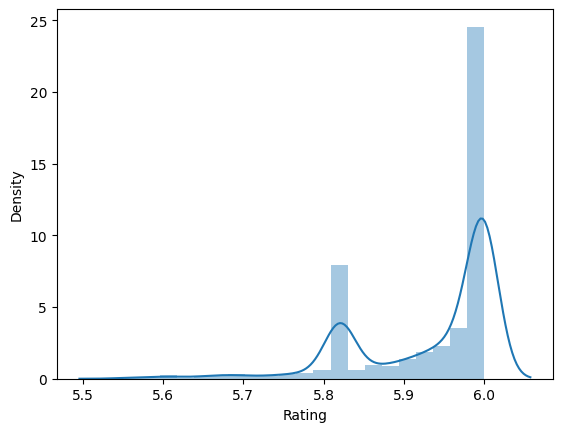

In [354]:
sns.distplot(vendor_df['Rating'])
plt.show()

In [355]:
# 로그변환 for right skewed
TS_log = np.log(vendor_df['TS'])
NoI_log = np.log(vendor_df['NoI'])
# Rating_log = np.log(vendor_df['Rating']) # left skewed
NoC_log = np.log(vendor_df['NoC'])

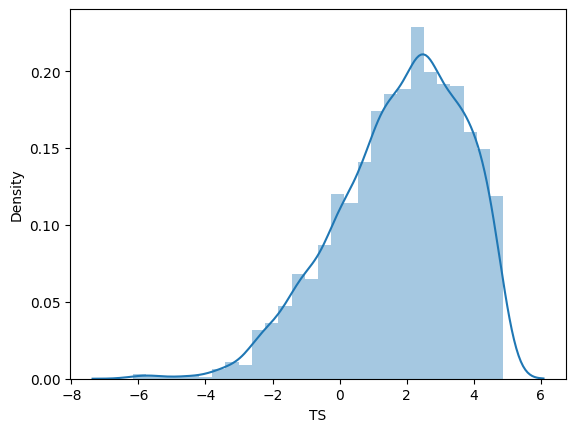

In [356]:
sns.distplot(TS_log);

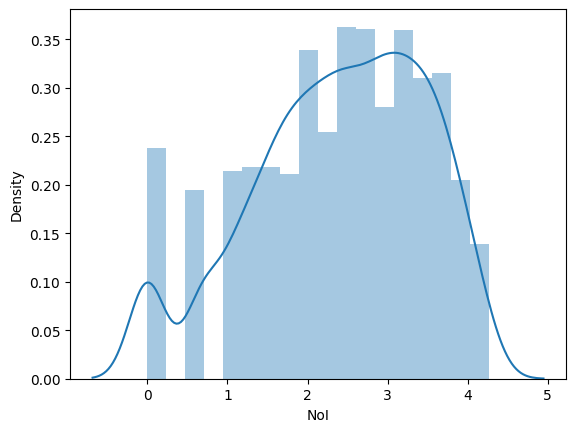

In [357]:
sns.distplot(NoI_log);

In [358]:
# sns.distplot(Rating_log);

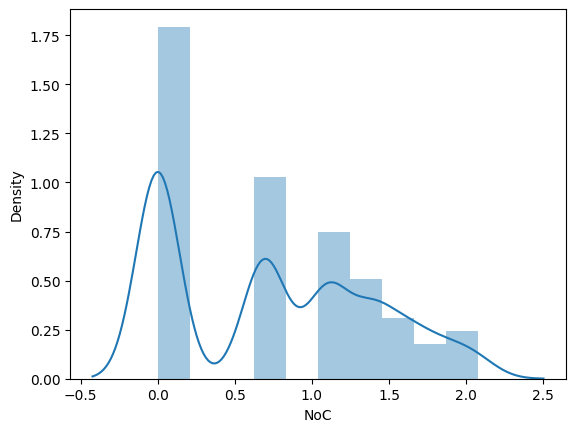

In [359]:
sns.distplot(NoC_log);

In [360]:
# 제곱근 변환
Rating_sqrt = np.sqrt(vendor_df['Rating'])

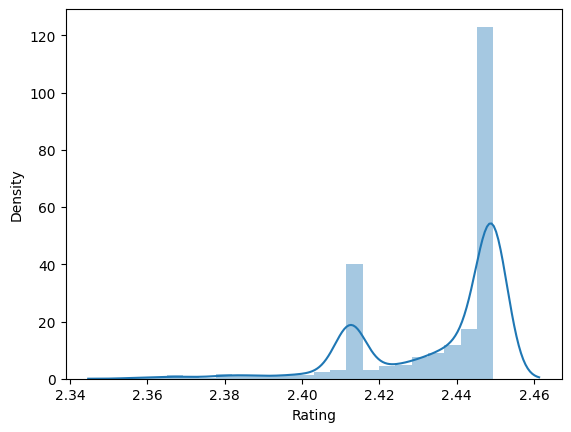

In [361]:
sns.distplot(Rating_sqrt);

In [362]:
# 역수 변환 + 로 그변환
inv_Rating_log = np.log(1 / vendor_df['Rating'])

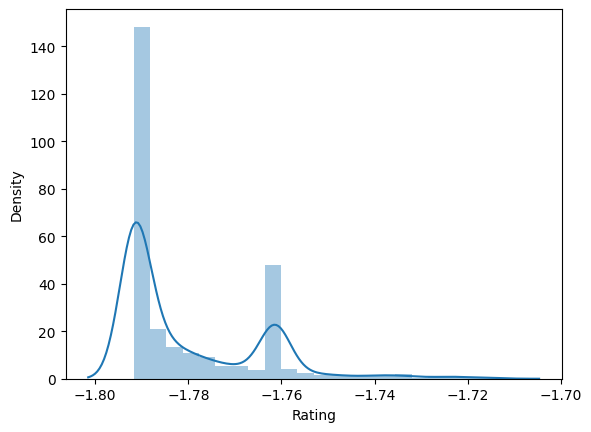

In [363]:
sns.distplot(inv_Rating_log);

In [364]:
# Box-Cox 변환 (0 이상의 값이어야 함)
vendor_df['Rating_boxcox'], _ = stats.boxcox(vendor_df['Rating'])

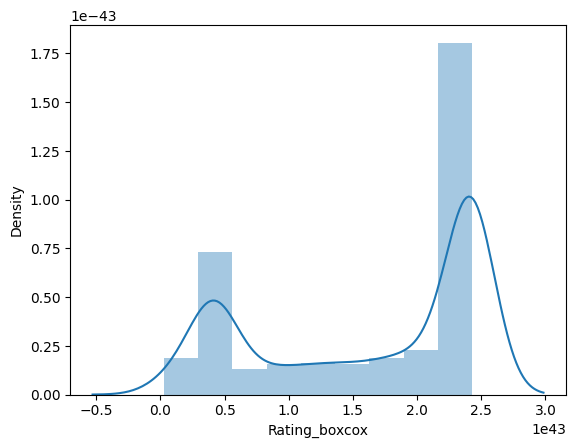

In [365]:
sns.distplot(vendor_df['Rating_boxcox']);

In [366]:
log_vendor_df = pd.concat([TS_log, NoI_log, vendor_df['Rating_boxcox']], axis=1)
log_vendor_df

,TS,NoI,Rating_boxcox
0,1.5325422233,1.6094379124,24292091221271647573548280869861946539638784.00...
1,0.9127430087,2.1972245773,3616984177375191151529943210177353765355520.000...
2,2.4881389719,2.5649493575,24292091221271647573548280869861946539638784.00...
3,0.7133158053,1.0986122887,4179162274005927156203938096473983535808512.000...
4,1.1717418153,1.0986122887,4179162274005927156203938096473983535808512.000...
...,...,...,...
3175,0.3269126182,1.7917594692,24292091221271647573548280869861946539638784.00...
3176,-1.3584521292,0.6931471806,3397879975672729004390146354225830902628352.000...
3177,-2.1936865964,1.0986122887,4179162274005927156203938096473983535808512.000...
3180,0.1319237824,1.3862943611,24292091221271647573548280869861946539638784.00...


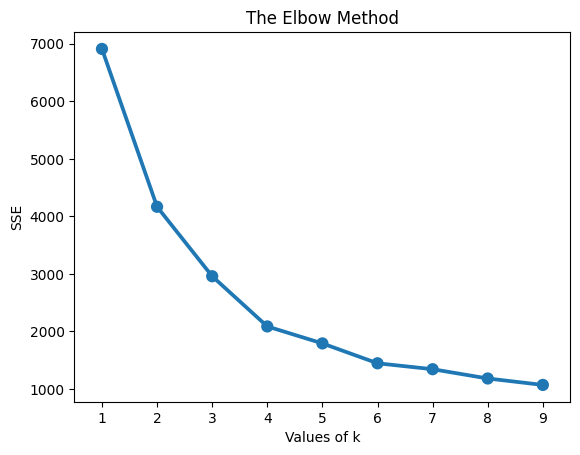

In [367]:
# 클러스터링

# 표준화
scaler = StandardScaler()
vendor_scaled = scaler.fit_transform(log_vendor_df)

sse = {}
for k in range(1,10):
  kmeans = KMeans(n_clusters=k, random_state=1)
  kmeans.fit(vendor_scaled)
  sse[k] = kmeans.inertia_

# 결과 시각화 
plt.title('The Elbow Method')
plt.xlabel('Values of k')
plt.ylabel('SSE')
sns.pointplot(x=list(sse.keys()), y=list(sse.values()))
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.36519785396087995
For n_clusters = 3 The average silhouette_score is : 0.3574481617936391
For n_clusters = 4 The average silhouette_score is : 0.3825533969560958
For n_clusters = 5 The average silhouette_score is : 0.36328393583661134
For n_clusters = 6 The average silhouette_score is : 0.34855454263215246
For n_clusters = 7 The average silhouette_score is : 0.33124505152909933
For n_clusters = 8 The average silhouette_score is : 0.3219627096101673
For n_clusters = 9 The average silhouette_score is : 0.31093954556628334


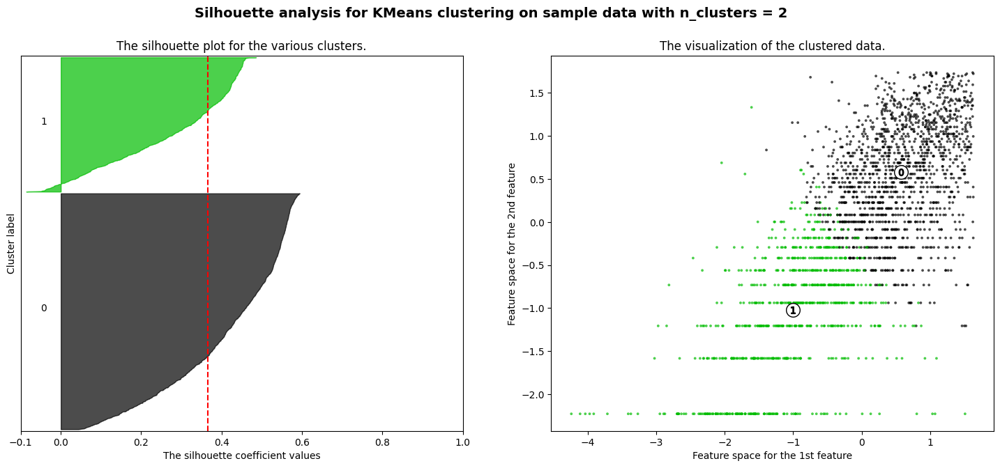

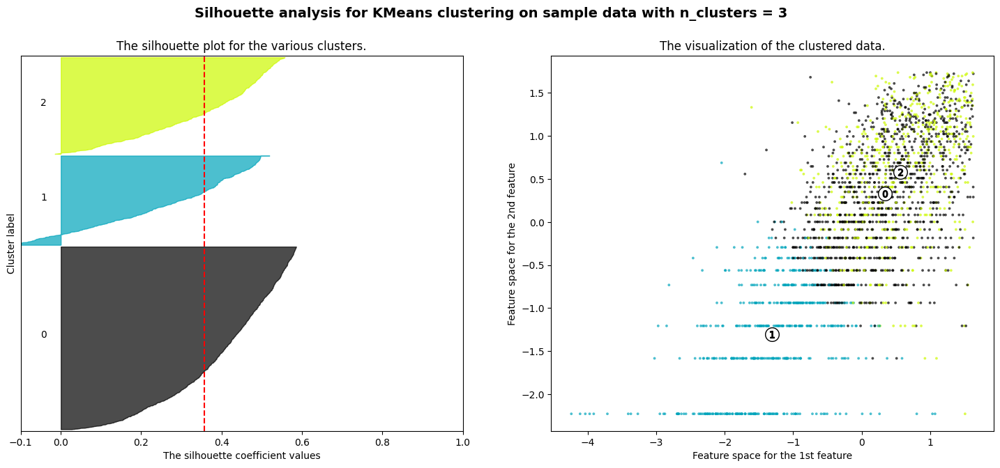

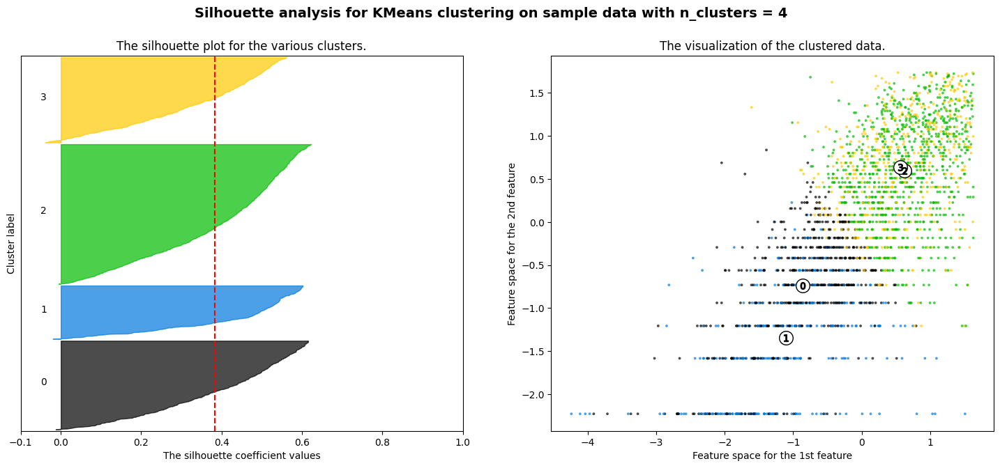

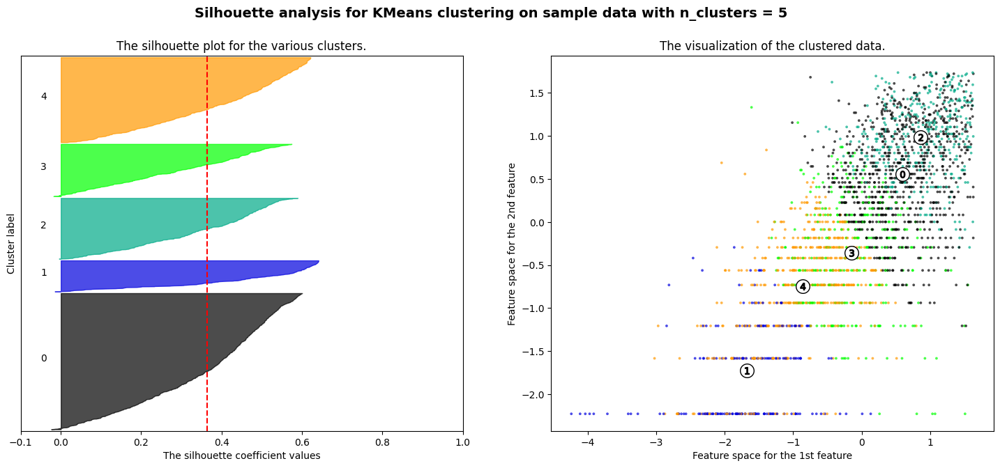

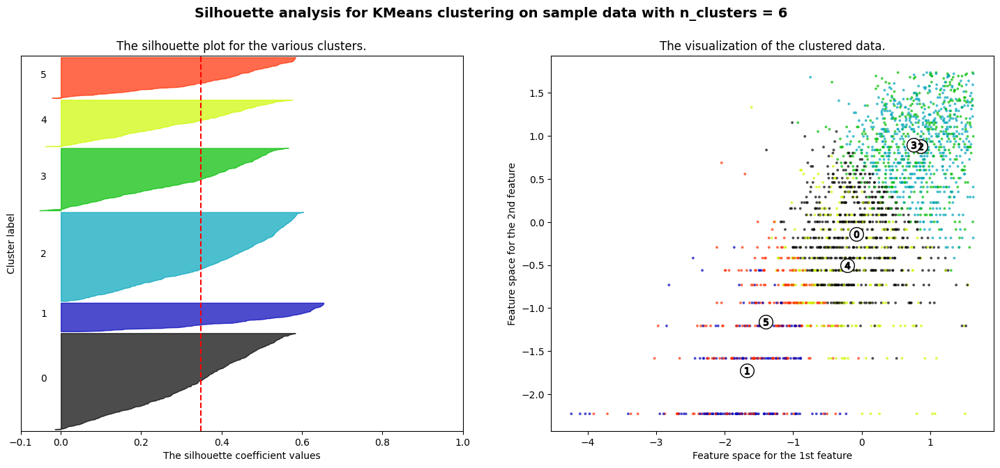

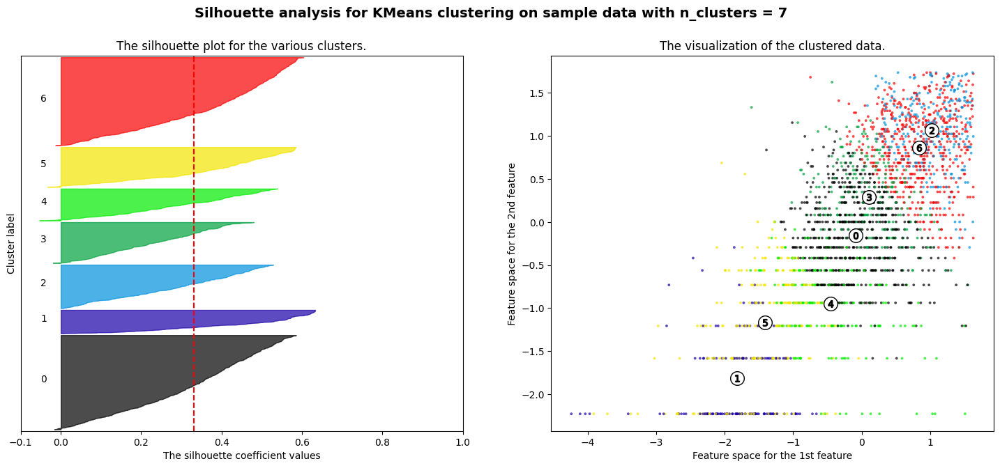

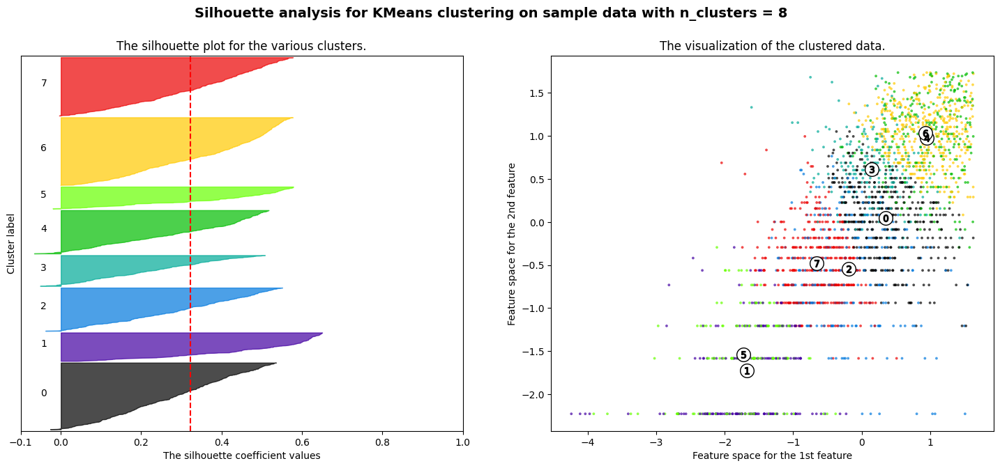

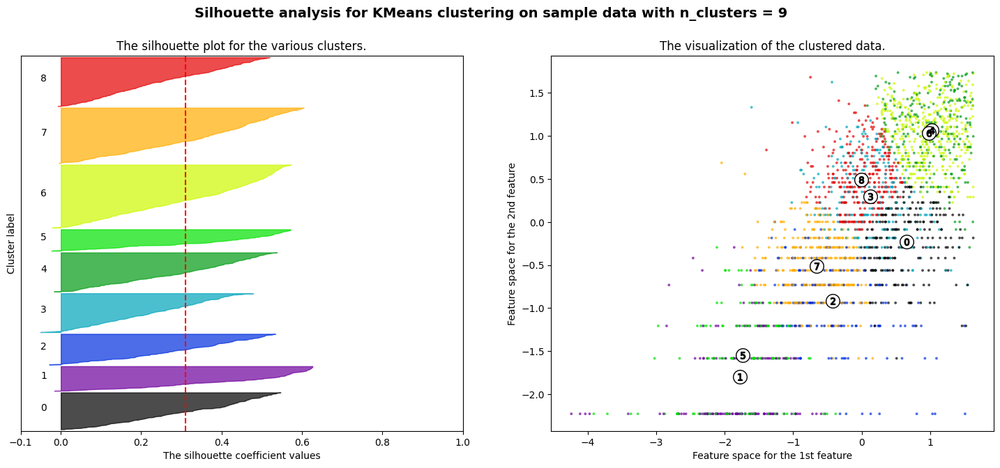

In [368]:
# Silhouette method 결과 시각화

x = vendor_scaled

for n_clusters in range(2,10):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(x) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(x)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(x, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(x, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(x[:, 0], x[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [369]:
# 최종 모델 학습
kmeans = KMeans(n_clusters=4, max_iter=50, random_state=42)
kmeans.fit(vendor_scaled)

# Vendor별 클러스터 지정
cluster_labels = kmeans.labels_

vendor_df_k3 = vendor_df.assign(Cluster = cluster_labels)

In [370]:
vendor_df_k3

,Vendor,TS,NoI,Rating,NoC,Rating_boxcox,ActivityIndex,Cluster
0,#NAME?,4.6299321950,5,6.0000000000,1,24292091221271647573548280869861946539638784.00...,low,3
1,-BIGG-BALLs-,2.4911464063,9,5.8062500000,3,3616984177375191151529943210177353765355520.000...,low,0
2,-Euphoria-,12.0388506203,13,6.0000000000,1,24292091221271647573548280869861946539638784.00...,high,1
3,-FliP-,2.0407467714,3,5.8207253916,1,4179162274005927156203938096473983535808512.000...,low,0
4,-Inanna-,3.2276096452,3,5.8207253916,1,4179162274005927156203938096473983535808512.000...,low,0
...,...,...,...,...,...,...,...,...
3175,zetaze,1.3866803013,6,6.0000000000,3,24292091221271647573548280869861946539638784.00...,low,3
3176,zohar,0.2570583623,2,5.8000000000,1,3397879975672729004390146354225830902628352.000...,low,0
3177,zolter,0.1115049163,3,5.8207253916,1,4179162274005927156203938096473983535808512.000...,low,0
3180,~FlatBushZombies~,1.1410213500,4,6.0000000000,1,24292091221271647573548280869861946539638784.00...,low,3


In [371]:
vendor_df_k3.groupby(['Cluster']).agg({
    'TS': 'mean',
    'NoI': 'mean',
    'Rating': 'mean',
    'NoC': ['mean','count']
})

TS           NoI       Rating          NoC      
                 mean          mean         mean         mean count
Cluster                                                            
0        2.8102041225  3.2908011869 5.8186585233 1.4065281899   337
1       31.0817602477 24.8605442177 5.9905771598 3.0725623583   882
2       31.3674723659 26.6971962617 5.8447915896 3.3813084112   535
3        2.1929674390  5.9708561020 5.9956124421 1.8688524590   549

In [372]:
# 클러스터별로 총판매량, 총판매아이템 갯수의 평균에서 차이가 남.

In [373]:
# 'Cluster' 열을 'ActivityIndex'로 이름 변경하고, 값을 'low', 'mid', 'high'로 변환
vendor_df_k3['ActivityIndex'] = vendor_df_k3['Cluster'].map({0: 'low', 1: 'mid', 2: 'high'})

# 'ActivityIndex' 열을 vendor_df에 추가
vendor_df['ActivityIndex'] = vendor_df_k3['ActivityIndex']

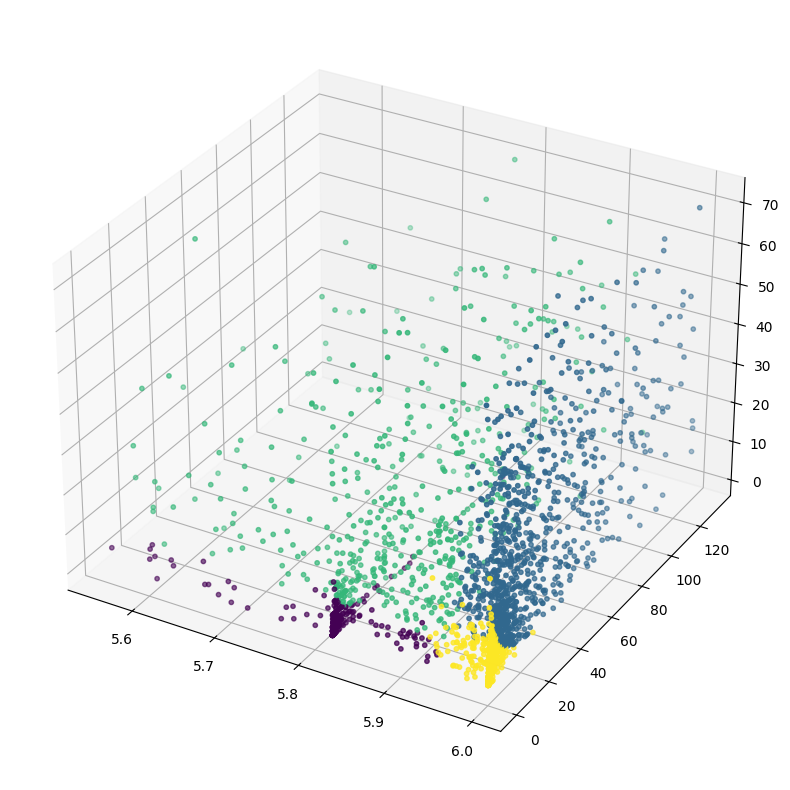

In [374]:
fig = plt.figure(figsize = (13,10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(xs = vendor_df_k3.Rating, ys = vendor_df_k3.TS, zs = vendor_df_k3.NoI, c=vendor_df_k3.Cluster
           ,s=10)

plt.show()

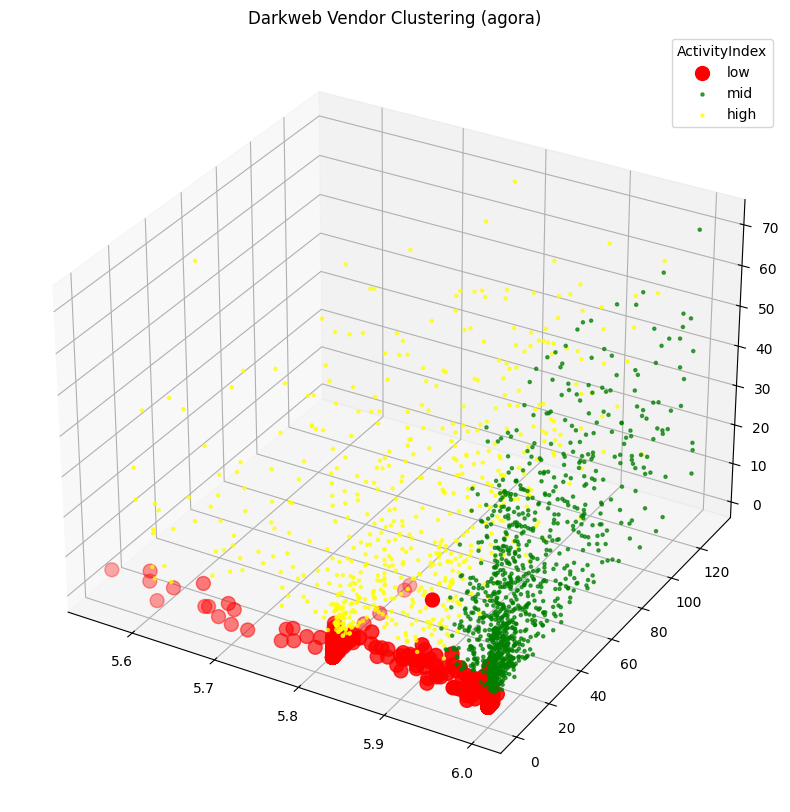

In [52]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(13, 10))
ax = fig.add_subplot(111, projection='3d')

# 클러스터별로 색상을 다르게 하여 산점도 그리기
colors = ['red', 'green', 'yellow']
labels = ['low', 'mid', 'high']

ax.scatter(xs=vendor_df_k3[vendor_df_k3.Cluster == 0].Rating, 
           ys=vendor_df_k3[vendor_df_k3.Cluster == 0].TS, 
           zs=vendor_df_k3[vendor_df_k3.Cluster == 0].NoI, 
           c=colors[0], 
           label=labels[0],
           s=100)

for i in range(1, 3):
    ax.scatter(xs=vendor_df_k3[vendor_df_k3.Cluster == i].Rating, 
               ys=vendor_df_k3[vendor_df_k3.Cluster == i].TS, 
               zs=vendor_df_k3[vendor_df_k3.Cluster == i].NoI, 
               c=colors[i], 
               label=labels[i], 
               alpha=0.7,
               s=5)
# 범례 추가
ax.legend(title='ActivityIndex')
ax.set_title('Darkweb Vendor Clustering (agora)')
# 표시
plt.show()

                                     count         mean          std  \
Category                                                               
Chemicals                    90.0000000000 1.0279055748 2.0229613447   
Counterfeits/Accessories    250.0000000000 0.3214344358 0.8803880953   
Counterfeits/Clothing       364.0000000000 0.2659498519 0.2486428939   
Counterfeits/Electronics     58.0000000000 0.5897872562 0.7557173165   
Counterfeits/Money          386.0000000000 2.2709780959 7.3468708536   
...                                    ...          ...          ...   
Weapons/Ammunition          136.0000000000 1.2052033007 8.5580397912   
Weapons/Fireworks            14.0000000000 0.1527069006 0.1410846032   
Weapons/Lethal firearms     342.0000000000 4.1808018229 3.0941772651   
Weapons/Melee               103.0000000000 0.3835003542 0.4448661839   
Weapons/Non-lethal firearms  57.0000000000 0.4789166144 0.7013940467   

                                     min          25%          

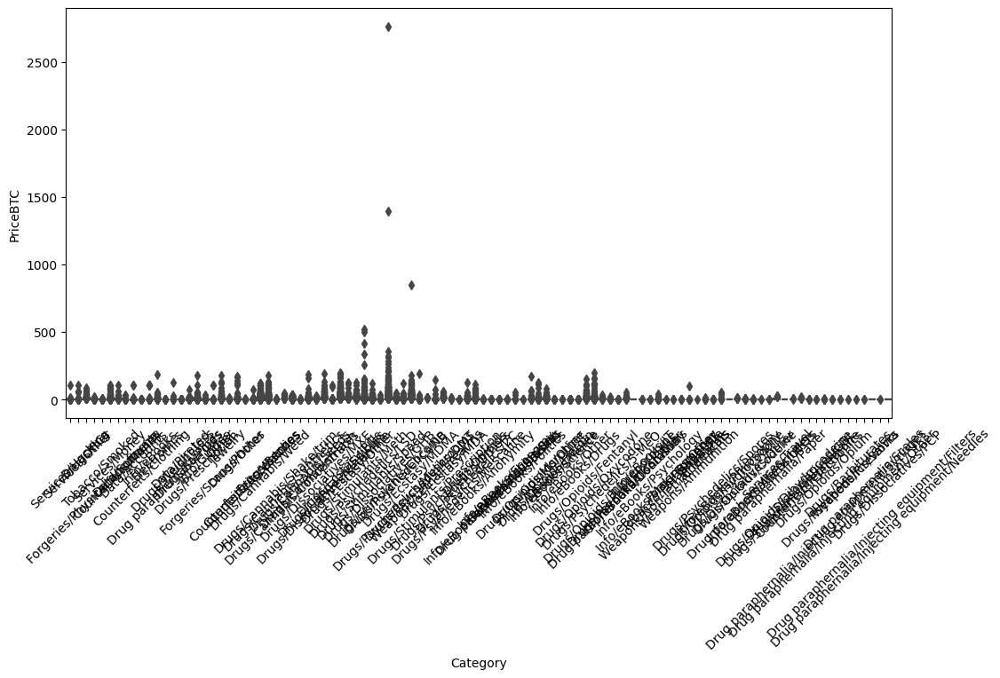

ANOVA Test: F-value = 30.75787579868559 , P-value = 2.8849118834506494e-25


In [53]:
# 그룹별 기술통계
grouped = df_copy.groupby('Category')['PriceBTC']
print(grouped.describe())

# 상자 그림
plt.figure(figsize=(12, 6))
sns.boxplot(x='Category', y='PriceBTC', data=df_copy)
plt.xticks(rotation=45)
plt.show()

# ANOVA 테스트
# 'Category'의 고유값이 많을 경우, 일부 대표적인 범주를 선택하여 분석
categories = df['Category'].unique()
if len(categories) > 5:
    categories = categories[:5]  # 예시: 첫 5개 범주 사용

anova_data = [df_copy[df_copy['Category'] == cat]['PriceBTC'].dropna() for cat in categories]
f_val, p_val = stats.f_oneway(*anova_data)
print("ANOVA Test: F-value =", f_val, ", P-value =", p_val)

In [54]:
# 'Category'를 '/'를 기준으로 분리
split_categories = df_copy['Category'].str.split('/', expand=True)
df_copy['Level1'] = split_categories[0]
df_copy['Level2'] = split_categories[1]
df_copy['Level3'] = split_categories[2]

# 레벨별 ANOVA 수행
def perform_anova(level):
    groups = df_copy.groupby(level)['PriceBTC']
    anova_data = [group.dropna() for name, group in groups]
    f_val, p_val = stats.f_oneway(*anova_data)
    print(f"ANOVA for {level}: F-value = {f_val}, P-value = {p_val}")

perform_anova('Level1')
perform_anova('Level2')
perform_anova('Level3')

ANOVA for Level1: F-value = 18.280927439094977, P-value = 3.544477798591529e-40
ANOVA for Level2: F-value = 16.574901547803215, P-value = 3.178171793466971e-116
ANOVA for Level3: F-value = 9.872147279558181, P-value = 4.509838786371179e-81


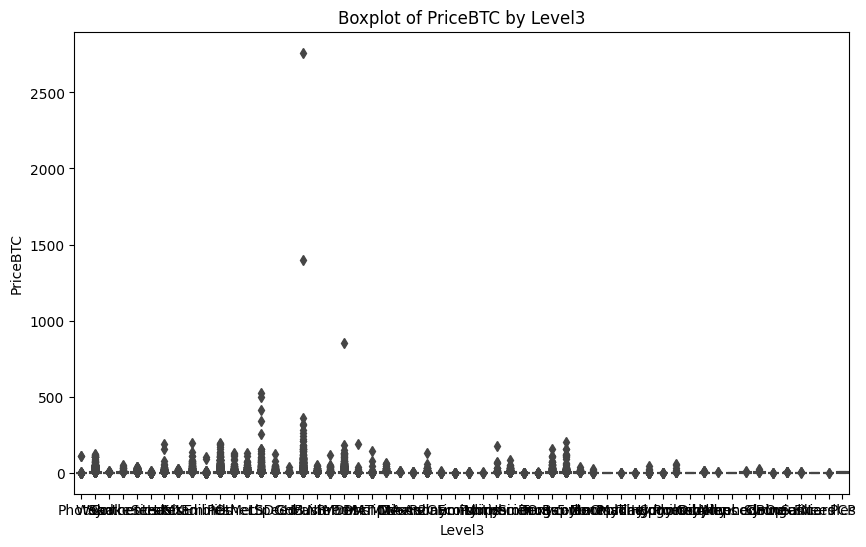

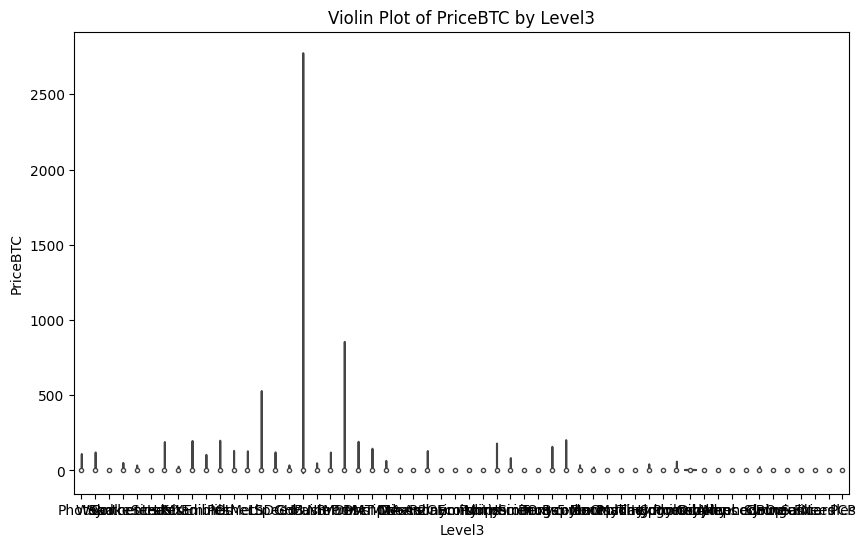

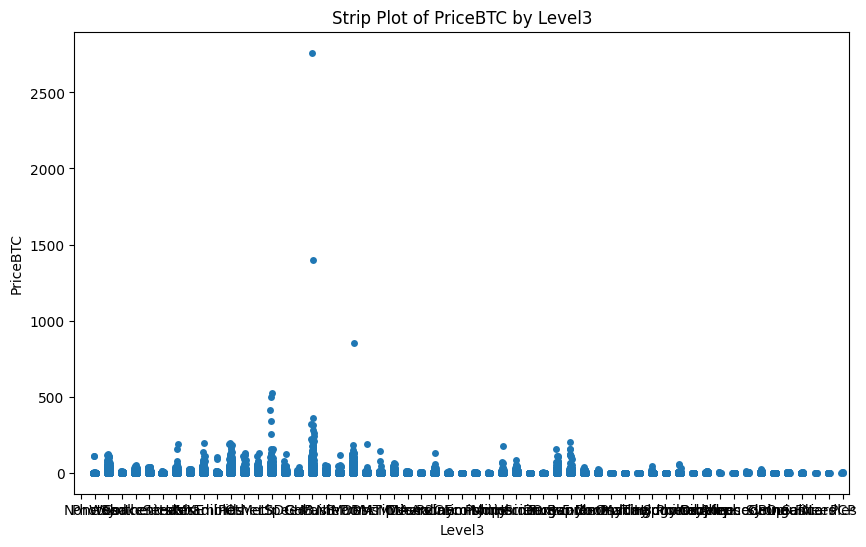

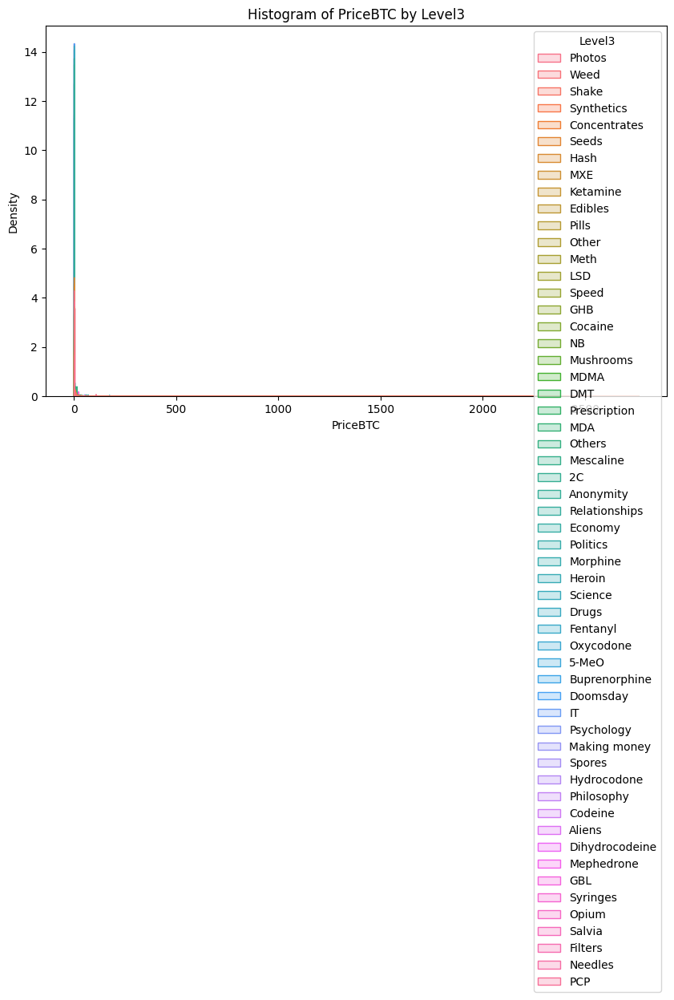

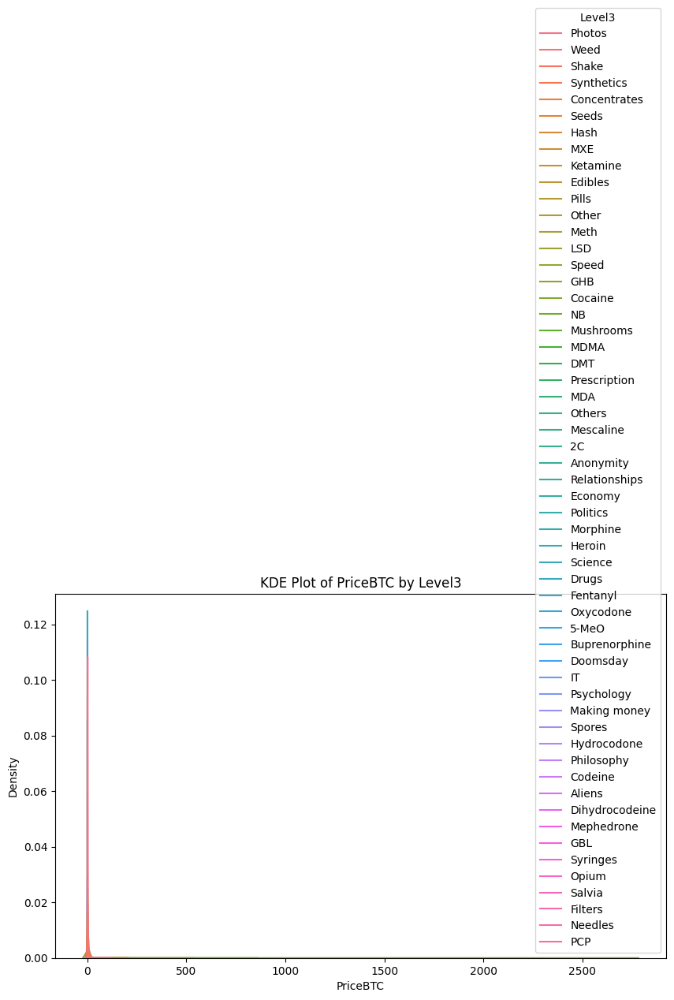

In [55]:
# 박스 플롯
plt.figure(figsize=(10, 6))
sns.boxplot(x='Level3', y='PriceBTC', data=df_copy)
plt.title('Boxplot of PriceBTC by Level3')
plt.show()

# 바이올린 플롯
plt.figure(figsize=(10, 6))
sns.violinplot(x='Level3', y='PriceBTC', data=df_copy)
plt.title('Violin Plot of PriceBTC by Level3')
plt.show()

# 스트립 플롯
plt.figure(figsize=(10, 6))
sns.stripplot(x='Level3', y='PriceBTC', data=df_copy, jitter=True)
plt.title('Strip Plot of PriceBTC by Level3')
plt.show()

# 히스토그램
plt.figure(figsize=(10, 6))
sns.histplot(data=df_copy, x='PriceBTC', hue='Level3', element='step', stat='density', common_norm=False)
plt.title('Histogram of PriceBTC by Level3')
plt.show()

# KDE 플롯
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df_copy, x='PriceBTC', hue='Level3')
plt.title('KDE Plot of PriceBTC by Level3')
plt.show()

In [56]:
# 레벨1, 레벨2, 레벨3을 결합하여 계층적 구조 생성
df_sunburst = df_copy.copy()

# 카테고리를 레벨별로 분리
split_categories = df_sunburst['Category'].str.split('/', expand=True)
df_sunburst['Level1'] = split_categories[0]
df_sunburst['Level2'] = split_categories[1].fillna(df_sunburst['Level1'])
df_sunburst['Level3'] = split_categories[2].fillna(df_sunburst['Level2'])

# 태양 플롯 생성
fig = px.sunburst(df_sunburst, path=['Level1', 'Level2', 'Level3'], color='Level2')
fig.update_layout(width=800, height=800, title='Sunburst Plot by Count')  # 차트 크기 조정
fig.show()

In [57]:
# 레벨1, 레벨2, 레벨3을 결합하여 계층적 구조 생성
df_sunburst = df_copy.copy()

# 카테고리를 레벨별로 분리
split_categories = df_sunburst['Category'].str.split('/', expand=True)
df_sunburst['Level1'] = split_categories[0]
df_sunburst['Level2'] = split_categories[1].fillna(df_sunburst['Level1'])
df_sunburst['Level3'] = split_categories[2].fillna(df_sunburst['Level2'])

# 태양 플롯 생성
fig = px.sunburst(df_sunburst, path=['Level1', 'Level2', 'Level3'], color='Level2')
fig.update_layout(width=800, height=800, title='Sunburst Plot by Count')  # 차트 크기 조정
fig.show()

# 레벨별 총 판매액 계산
df_grouped = df_sunburst.groupby(['Level1', 'Level2', 'Level3']).agg({'PriceBTC': 'sum'}).reset_index()

# 태양 플롯 생성
fig = px.sunburst(df_grouped, path=['Level1', 'Level2', 'Level3'], values='PriceBTC', color='Level2')
fig.update_layout(width=800, height=800, title='Sunburst Plot by Total PriceBTC')  # 차트 크기 조정
fig.show()

In [58]:
# 'Drugs' 카테고리 제외
df_no_drugs = df_sunburst[df_sunburst['Level1'] != 'Drugs']

# 카테고리를 레벨별로 분리
split_categories = df_no_drugs['Category'].str.split('/', expand=True)
df_no_drugs['Level1'] = split_categories[0]
df_no_drugs['Level2'] = split_categories[1].fillna(df_no_drugs['Level1'])
df_no_drugs['Level3'] = split_categories[2].fillna(df_no_drugs['Level2'])

# 레벨별 총 판매액 계산
df_grouped_sum = df_no_drugs.groupby(['Level1', 'Level2', 'Level3']).agg({'PriceBTC': 'sum'}).reset_index()

# 레벨별 개수 계산
df_grouped_count = df_no_drugs.groupby(['Level1', 'Level2', 'Level3']).size().reset_index(name='Count')

# 태양 플롯 (PriceBTC 총합 기준)
fig_sum = px.sunburst(df_grouped_sum, path=['Level1', 'Level2', 'Level3'], values='PriceBTC', color='Level1')
fig_sum.update_layout(width=800, height=800, title='Sunburst Plot by Total PriceBTC (Excluding Drugs)')
fig_sum.show()

# 태양 플롯 (개수 기준)
fig_count = px.sunburst(df_grouped_count, path=['Level1', 'Level2', 'Level3'], values='Count', color='Level1')
fig_count.update_layout(width=800, height=800, title='Sunburst Plot by Count (Excluding Drugs)')
fig_count.show()

In [59]:
df_copy[['Item','Item Description']].sample(20)

,Item,Item Description
61745,pseudoephedrine 100g stealth shipping,pseudoephedrine 100g pharmaceutical purity 95 ...
47095,.75 gr meth grade new vendor sale,looking best meth right price right place. wan...
30329,baclofen,baclofen muscle relaxants awesome norflex rath...
19898,500gr original amnesia haze 22 thc grade coffe...,offer bill amnesia haze original one. cross br...
73522,78 pure tested source b flake cocaine new addi...,shipping worldwide. 5 successful buys needed e...
98198,custom 35,custom 35
107911,5 g weed kush aaa,les origines du kush sont des vari t s de plan...
76657,1000x 25d nbome blotter 1000ug,plenty feedbacks evolution link 1000x 25d nbom...
78929,phenazepam... 20 gram,plz read main profile order item phenazepam qu...
18251,kamagra blue pill pack 4 uk uk boner pills,listing 4 x kamagra erectile dystfunction trea...


In [60]:
df_copy['Item Description'].isna().sum()

27

In [61]:
df_copy.Item

0                               12 month huluplus gift code
1         pay tv sky uk sky germany hd tv more.. cccam s...
2                      official account creator extreme 4.2
3                                     vpn tor sock tutorial
4                                    facebook hacking guide
                                ...                        
108687    sample monster beats 2014 beats powerbeats gra...
108688                          1g flake opium free express
108689                                opium 0.125g beginner
108690    10 pack bd brand 3ml luer lock sy ringes 25g x...
108691                    .10 g opium latex free postage fe
Name: Item, Length: 108692, dtype: object

In [ ]:
df2_copy['Item'] = df2_copy['Item'].fillna('')

In [84]:
# NaN 값을 빈 문자열로 대체
df_copy['Item'] = df_copy['Item'].fillna('')

tfidf_vect = TfidfVectorizer(stop_words='english', max_features=25000)

# Fit 후 dtm을 만듭니다.(문서, 단어마다 tf-idf 값을 계산합니다)
dtm_tfidf_agora = tfidf_vect.fit_transform(df_copy['Item'])

dtm_tfidf_agora = pd.DataFrame(dtm_tfidf_agora.todense(), columns=tfidf_vect.get_feature_names_out())
dtm_tfidf_agora

,00,000,00000,0001597,0005stk,000dollar,000eu,000euro,000g,000gr,...,zulualphaafrican,zxc,zyban,zydol,zydus,zz,zz99,zzz,zzzzesty,zzzzzzzzz90
0,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
1,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
2,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
3,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
4,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108687,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
108688,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
108689,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000
108690,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000


In [103]:


# dtm을 사용히 NN 모델을 학습시킵니다. (디폴트)최근접 2 이웃.
nn = NearestNeighbors(n_neighbors=2, algorithm='kd_tree')
nn.fit(dtm_tfidf_agora)

NearestNeighbors(algorithm='kd_tree', n_neighbors=2)

In [105]:
nn.kneighbors([dtm_tfidf_agora.iloc[7752]])

(array([[0.        , 0.40305305]]), array([[7752, 7247]]))

In [106]:
df_copy.loc[[7752, 7247]]

,Vendor,Category,Item,Item Description,PriceBTC,Origin,Destination,Rating,Remarks,Level1,Level2,Level3
7752,MrCronk,Drugs/Cannabis/Weed,7g highgrade thai stick w ndd,sweet day delivery strong outdoor pure sativa ...,0.1900964775,undeclared,worldwide,4.9440000000,NaN,Drugs,Cannabis,Weed
7247,MrCronk,Drugs/Cannabis/Weed,3.5g highgrade thai stick w ndd,sweet day delivery strong outdoor pure sativa ...,0.1571819628,undeclared,worldwide,4.9440000000,NaN,Drugs,Cannabis,Weed


In [98]:
sample = ["""Ray Ban RB3025 Aviator Classic Sunglasses Replica"""]

In [100]:
new = tfidf_vect.transform(sample)
new_array = np.asarray(new.todense())
nn.kneighbors(new_array)

(array([[0.60195814, 0.87265063, 0.87609383, 0.94192618, 0.99499794]]),
 array([[64722, 83468, 72712, 92636,  4913]]))

In [102]:
df_copy['Category'].loc[64722]

'Counterfeits/Watches'

In [155]:
# df2_copy의 각 Item에 대해 가장 가까운 이웃 찾기 및 Category 할당
for idx, row in df2_copy.iterrows():
    sample = [row['Item']]
    new = tfidf_vect.transform(sample)
    new_array = np.asarray(new.todense())
    distances, neighbors = nn.kneighbors(new_array)
    
    # 가장 가까운 이웃의 인덱스를 사용하여 Category 할당
    nearest_idx = neighbors[0][0]
    df2_copy.at[idx, 'Category'] = df_copy['Category'].loc[nearest_idx]

KeyboardInterrupt: 

In [370]:
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################
########################################################################################################################

In [93]:
df2 = pd.read_excel("./dataset/mastersr2.xlsx")
df2.head()

,Title,Sellerid,PriceUSD,PriceBTC,Rating,Reviews,Origin,Destination,Category,Subcategory,Market,Date
0,Ray Ban Tech RB3460 001 Aviator/Flip Out/ Sung...,FoxyGirl,61.1615418288,0.0982320000,NaN,NaN,China,Worldwide,Apparel,NaN,SilkRoad2,2014-07-17
1,Ray Ban RB3025 Aviator Classic Sunglasses Replica,FoxyGirl,37.9625939448,0.0609720000,NaN,NaN,China,Worldwide,Apparel,NaN,SilkRoad2,2014-07-17
2,Rolex - Watch Box (AAA Grade Replica),RepAAA,100.4297770434,0.1613010000,NaN,NaN,"Hong Kong, (China)",Worldwide,Apparel,NaN,SilkRoad2,2014-07-17
3,Ray Ban RB3016 - W0365 | Clubmaster Sunglasses...,FoxyGirl,45.3437943518,0.0728270000,NaN,NaN,China,Worldwide,Apparel,NaN,SilkRoad2,2014-07-17
4,Rolex - Submariner 2Tone YG/SS Black [Replica],RepAAA,149.6350817220,0.2403300000,NaN,NaN,"Hong Kong, (China)",Worldwide,Apparel,NaN,SilkRoad2,2014-07-17


In [108]:
df2.columns

Index(['Title', 'Sellerid', 'PriceUSD', 'PriceBTC', 'Rating', 'Reviews',
       'Origin', 'Destination', 'Category', 'Subcategory', 'Market', 'Date'],
      dtype='object')

In [109]:
df2_copy = df2.copy()

# 칼럼명 변경
df2_copy.rename(columns={'Title': 'Item', 'Sellerid': 'Vendor'}, inplace=True)

# 'Category'와 'Subcategory' 칼럼을 합쳐서 'Category/Subcategory' 형태로 만들기
df2_copy['Category'] = df2['Category'] + '/' + df2['Subcategory']

# 불필요한 칼럼 삭제
df2_copy.drop(columns=['Subcategory', 'Market'], inplace=True)

# 결과 확인
df2_copy.head()

,Item,Vendor,PriceUSD,PriceBTC,Rating,Reviews,Origin,Destination,Category,Date
0,Ray Ban Tech RB3460 001 Aviator/Flip Out/ Sung...,FoxyGirl,61.1615418288,0.0982320000,NaN,NaN,China,Worldwide,NaN,2014-07-17
1,Ray Ban RB3025 Aviator Classic Sunglasses Replica,FoxyGirl,37.9625939448,0.0609720000,NaN,NaN,China,Worldwide,NaN,2014-07-17
2,Rolex - Watch Box (AAA Grade Replica),RepAAA,100.4297770434,0.1613010000,NaN,NaN,"Hong Kong, (China)",Worldwide,NaN,2014-07-17
3,Ray Ban RB3016 - W0365 | Clubmaster Sunglasses...,FoxyGirl,45.3437943518,0.0728270000,NaN,NaN,China,Worldwide,NaN,2014-07-17
4,Rolex - Submariner 2Tone YG/SS Black [Replica],RepAAA,149.6350817220,0.2403300000,NaN,NaN,"Hong Kong, (China)",Worldwide,NaN,2014-07-17


In [110]:
df2_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 618860 entries, 0 to 618859
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Item         617074 non-null  object 
 1   Vendor       616845 non-null  object 
 2   PriceUSD     618860 non-null  object 
 3   PriceBTC     618860 non-null  object 
 4   Rating       292663 non-null  float64
 5   Reviews      292663 non-null  float64
 6   Origin       616839 non-null  object 
 7   Destination  616838 non-null  object 
 8   Category     398499 non-null  object 
 9   Date         617074 non-null  object 
dtypes: float64(2), object(8)
memory usage: 47.2+ MB


In [111]:
# 중복된 모든 행 삭제
df2_copy = df2_copy.drop_duplicates()

# 인덱스 재설정
df2_copy.reset_index(drop=True, inplace=True)

In [112]:
# PriceUSD와 PriceBTC 텍스트 전처리

# 공백 제거 및 숫자, 소수점 외 문자 제거 함수
def clean_price(price):
    if not isinstance(price, str):
        return price
    # 숫자와 소수점을 제외한 문자 제거
    price = re.sub(r'[^0-9.]', '', price)
    # 모든 공백 제거
    price = price.replace(" ", "")
    # 소수점 앞뒤에 숫자가 있는지 확인
    price = re.sub(r'(?<!\d)\.|\.(?!\d)', '', price)
    return price

# PriceUSD와 PriceBTC 열 정리
df2_copy['PriceUSD'] = df2_copy['PriceUSD'].apply(clean_price)
df2_copy['PriceBTC'] = df2_copy['PriceBTC'].apply(clean_price)

# 문자열을 float로 변환
df2_copy['PriceUSD'] = pd.to_numeric(df2_copy['PriceUSD'], errors='coerce')
df2_copy['PriceBTC'] = pd.to_numeric(df2_copy['PriceBTC'], errors='coerce')

# null 값이나 0인 행 삭제
df2_copy = df2_copy[df2_copy['PriceUSD'].notnull() & (df2_copy['PriceUSD'] != 0)]
df2_copy = df2_copy[df2_copy['PriceBTC'].notnull() & (df2_copy['PriceBTC'] != 0)]

# 인덱스 재설정
df2_copy.reset_index(drop=True, inplace=True)

# # 결과 확인
# print(df2_copy[['PriceUSD', 'PriceBTC']])


In [113]:
# Date 열을 datetime 타입으로 변환
df2_copy['Date'] = pd.to_datetime(df2_copy['Date'], errors='coerce', format='%Y-%m-%d')

# NaT 값을 포함하는 행 삭제
df2_copy = df2_copy.dropna(subset=['Date'])

# 인덱스 재설정
df2_copy.reset_index(drop=True, inplace=True)

# # 결과 확인
# print(df2_copy['Date'])


In [114]:
### 'Item' 텍스트 전처리

# Spacy의 영어 불용어 목록 로드
nlp = spacy.load('en_core_web_sm')
stopwords = nlp.Defaults.stop_words.union([]) # 여기에 추가적인 불용어를 추가할 수 있습니다.

# 화폐 기호를 단어로 변환하는 함수
def replace_currency_symbols(text):
    currency_symbols = {
        '$': 'dollar',
        '€': 'euro',
        '£': 'pound'
    }
    for symbol, word in currency_symbols.items():
        text = re.sub(rf'(\d+){re.escape(symbol)}', r'\1' + word, text) # 숫자 뒤에 기호
        text = re.sub(rf'{re.escape(symbol)}(\d+)', r'\1' + word, text) # 기호 앞에 숫자
    return text

# 숫자 앞뒤 및 사이의 공백 제거
def remove_spaces_around_numbers(text):
    # # 숫자 앞뒤의 공백 제거
    # text = re.sub(r'\s+(\d+)', r'\1', text)
    # text = re.sub(r'(\d+)\s+', r'\1', text)
    # 숫자 사이의 공백 제거
    text = re.sub(r'(\d+)\s+(\d+)', r'\1\2', text)
    return text

# 숫자 사이의 콤마를 삭제하는 함수
def remove_commas_from_numbers(text):
    return re.sub(r'(\d+),(\d+)', r'\1\2', text)

# 텍스트 전처리 함수
def preprocess_text(text):
    if not isinstance(text, str):
        return text
    
    # 숫자 사이의 콤마 삭제
    text = remove_commas_from_numbers(text)
    # 링크 주소 삭제
    text = re.sub(r'https?:\/\/\S+', '', text)
    # 화폐 기호 처리
    text = replace_currency_symbols(text)
    # 숫자와 숫자 사이의 점만 유지
    text = re.sub(r'(\d)\.(\d)', r'\1.\2', text)
    # 특수 문자 및 알파벳이 아닌 기호 제거 (소수점 유지)
    text = re.sub(r'[^a-zA-Z0-9.\s]', ' ', text)
    # 두 칸 이상의 공백을 한 칸으로 변환
    text = re.sub(r'\s\s+', ' ', text)
    # 소문자화
    text = text.lower()
    # 불용어 제거
    text = ' '.join([word for word in text.split() if word not in stopwords])
    # # 숫자 관련 공백 처리
    # text = remove_spaces_around_numbers(text)
    
    return text.strip()

# 'Item'과 'Item Description' 칼럼에 텍스트 전처리 적용
df2_copy['Item'] = df2_copy['Item'].apply(preprocess_text)

In [115]:
# Rating, Reviews 열의 NaN 값을 0으로 채우기
df2_copy['Rating'] = df2_copy['Rating'].fillna(0)
df2_copy['Reviews'] = df2_copy['Reviews'].fillna(0)

In [116]:
### 'Origin'과 'Destination' 텍스트 전처리

# # 소문자화할 칼럼 선택
# columns_to_lowercase = ['Origin', 'Destination']

# # 선택한 칼럼에 대해 소문자화 적용
# df[columns_to_lowercase] = df[columns_to_lowercase].apply(lambda x: x.str.lower())


# 특수 문자 제거, 특정 단어 제거, 두 번 연속되는 공백을 한 번의 공백으로 변환하는 함수
def clean_text(text):
    if pd.isna(text) or not isinstance(text, str):
        return text
    text = text.strip()
    # 'only', 'and', 'some', 'others', 'other' 제거
    text = re.sub(r'\b(only|and|some|others|other)\b', ' ', text)
    ## 'and' 제거
    # text = re.sub(r'and', ' ', text)
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text.lower())  # 특수 문자 제거 & 소문자화
    text = re.sub(r'\s\s+', ' ', text)  # 두 번 연속되는 공백을 한 번의 공백으로 변환
    return text.strip()

# 'Origin'과 'Destination' 칼럼 정리
df2_copy['Origin'] = df2_copy['Origin'].apply(clean_text)
df2_copy['Destination'] = df2_copy['Destination'].apply(clean_text)

# 동의어 매핑 생성
location_mapping = {
    'us': 'usa',
    'america': 'usa',
    'world': 'worldwide',
    'united states' : 'usa',
    'torland' : 'internet',
    'europe union' : 'eu',
    'torlandnz' : 'internet',
    'united states of america' : 'usa',
    'global' : 'worldwide',
    'worldwide international': 'worldwide',
    'europe germany' : 'eu',
    'germany eu' : 'eu',
    'uk eu' : 'eu',
    'united kingdom' : 'uk',
    'you' : 'worldwide',
    'germany europe' : 'eu',
    'unitedkingdom' : 'uk',
    'worldwide on request' : 'worldwide',
    'anywhere' : 'worldwide',
    'international worldwide' : 'worldwide',
    'europe' : 'eu',
    'world wide': 'worldwide',
    'everywhere': 'worldwide',
    'european union': 'eu',
    'international': 'worldwide',
    'wordwide': 'worldwide',
    'worlwide': 'worldwide',
    'no restrictions': 'worldwide',
    'ww': 'worldwide',
    'wideworld': 'worldwide',
    'us domestic': 'usa',
    'germany and europe': 'eu',
    'europe and germany': 'eu',
    'europe norway swizz' : 'eu',
    'finland and eu': 'eu',
    'eu countries': 'eu',
    'woldwide': 'worldwide',
    'everywhere worldwide any destination ': 'worldwide',
    'all': 'worldwide',
    'every where': 'worldwide',
    'internationally': 'worldwide',
    'wolrdwide': 'worldwide',
    'europa': 'eu',
    'europe for the moment': 'eu',
    'free worldwide': 'worldwide',
    'world mars jupiter': 'worldwide',
    'beta worldwide': 'worldwide',
    'international worldwide shipping': 'worldwide',
    'worldwide upon request': 'worldwide',
    'universe': 'worldwide',
    'european countries': 'eu',
    'worldwide free super stealth': 'worldwide',
    'w o r l d w i d e': 'worldwide',
    'universal': 'worldwide',
    'wordlwide': 'worldwide',
    'worldwiede': 'worldwide',
    'worldide': 'worldwide',
    'worldd': 'worldwide',
    'wide': 'worldwide',
    'worldwide w tracking': 'worldwide',
    'worldiwde': 'worldwide',
    'worldwid': 'worldwide',
    'earth': 'worldwide',
    'wrol': 'worldwide',
    'usa uk worldwide' : 'worldwide',
    'theunitedsnakes' : 'usa',
    'ww shipping' : 'worldwide',
    'europe uk' : 'eu',
    'eu scandinavia fe' : 'eu',
    'aus' : 'australia',
    'worldwide eu scandinavia' : 'worldwide',
    'euuk' : 'eu',
    'uk europe' : 'eu',
    'uk euro worldwide' : 'worldwide',
    'finland eu' : 'eu',
    'to europe' : 'eu',
    'eugermany' : 'eu',
    'swiss eu' : 'eu',
    'ukeu' : 'eu',
    'worldwide see profile' : 'worldwide',
    'europe switzerland norway' : 'eu',
    'domestic usa' : 'usa',
    'uk ask' : 'uk',
    'scandinaviaeurope' : 'eu',
    'germany europe schweiz' : 'eu',
    'of captivity to the human race' : 'worldwide',
    'scandinavia ww' : 'worldwide',
    'anywhere man' : 'worldwide',
    'worldwide prior' : 'worldwide',
    'ukeurope' : 'eu',
    'worldwide any destination everywhere' : 'worldwide',
    'uk ire' : 'uk',
    'eu uk' : 'eu',
    'the united snakes of captivity' : 'usa',
    'ukeurope' : 'eu',
    'worldwide to usa uk worldwide' : 'worldwide',
    'imgclassflagimgsrcimagesflagw13auspng' : 'australia',
    'agora' : 'internet',
    'germany germany' : 'germany',
    'usa worldwide' : 'usa',
    'usa man' : 'usa',

    'united states amp canada' : 'usa and canada',
    'united states canada' : 'usa and canada',
    'european union uk worldwide' : 'worldwide',
    'hong kong china' : 'china',
    'hongkong' : 'china',
    'hong kong' : 'china',
    'hong' : 'china'

    # 추가적인 매핑을 추가
}

# Destination 및 Origin 칼럼 변환 함수
def standardize_location(location):
    return location_mapping.get(location, location)

# 칼럼에 매핑 적용
df2_copy['Destination'] = df2_copy['Destination'].map(standardize_location)
df2_copy['Origin'] = df2_copy['Origin'].map(standardize_location)

# # 결과 확인
# print(df2_copy['Destination'].value_counts())
# print(df2_copy['Origin'].value_counts())

In [117]:
# 지정된 키워드 중 하나라도 포함하는 조건
keywords = ['lsd', 'cocaine', 'kg', 'kilogram', 'kilograms']
condition_keywords = df2_copy['Item'].str.contains('|'.join(keywords), case=False, na=False)

# PriceBTC가 200 이상이지만, 위 키워드를 포함하지 않는 조건
condition_delete = (~condition_keywords) & (df2_copy['PriceBTC'] >= 200)

# 조건에 해당하는 행 삭제
df2_copy = df2_copy[~condition_delete]

# PriceUSD가 0.9 이하인 행 삭제 (광고성 문구가 많음)
df2_copy = df2_copy[df2_copy['PriceUSD'] > 0.9]

# PriceBTC 1500 이상인 행 삭제 (물폼의 종류,양에 비해 지나치게 비쌈)
df2_copy = df2_copy[df2_copy['PriceBTC'] < 1500]

# 인덱스 재설정
df2_copy.reset_index(drop=True, inplace=True)

In [118]:
# Rating 5 이상인 행 삭제
df2_copy = df2_copy[df2_copy['Rating'] < 5.1]

In [119]:
df2_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 566564 entries, 0 to 567218
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Item         566564 non-null  object        
 1   Vendor       566340 non-null  object        
 2   PriceUSD     566564 non-null  float64       
 3   PriceBTC     566564 non-null  float64       
 4   Rating       566564 non-null  float64       
 5   Reviews      566564 non-null  float64       
 6   Origin       566341 non-null  object        
 7   Destination  566341 non-null  object        
 8   Category     361522 non-null  object        
 9   Date         566564 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(4), object(5)
memory usage: 47.5+ MB


In [120]:
######### 전처리 끝 ###########################

In [121]:
######### 적용 ##############################

df2 = df2_copy

###########################################

In [122]:
######### 통계분석 ###########################

In [172]:
# Origin에 대한 처리
origin_counts = df_copy['Origin'].value_counts()
top_20_origins = origin_counts.head(20).index
df_copy['Origin_top20'] = df_copy['Origin'].apply(lambda x: x if x in top_20_origins else 'others')

# Destination에 대한 처리
destination_counts = df_copy['Destination'].value_counts()
top_20_destinations = destination_counts.head(20).index
df_copy['Destination_top20'] = df_copy['Destination'].apply(lambda x: x if x in top_20_destinations else 'others')

# 결과 확인
print(df_copy[['Origin_top20', 'Destination_top20']].head())



  Origin_top20 Destination_top20
0     internet            others
1     internet            others
2     internet            others
3       others            others
4     internet            others


In [199]:
df2_copy

,Item,Vendor,PriceUSD,PriceBTC,Rating,Reviews,Origin,Destination,Category,Date,Level1,Level2,Origin_top20,Destination_top20
0,ray ban tech rb3460 001 aviator flip sunglasse...,FoxyGirl,61.1615418288,0.0982320000,0.0000000000,0.0000000000,china,worldwide,Counterfeits/Accessories,2014-07-17,Counterfeits,Accessories,china,worldwide
1,ray ban rb3025 aviator classic sunglasses replica,FoxyGirl,37.9625939448,0.0609720000,0.0000000000,0.0000000000,china,worldwide,Counterfeits/Watches,2014-07-17,Counterfeits,Watches,china,worldwide
2,rolex watch box aaa grade replica,RepAAA,100.4297770434,0.1613010000,0.0000000000,0.0000000000,china,worldwide,Counterfeits/Watches,2014-07-17,Counterfeits,Watches,china,worldwide
3,ray ban rb3016 w0365 clubmaster sunglasses rep...,FoxyGirl,45.3437943518,0.0728270000,0.0000000000,0.0000000000,china,worldwide,Counterfeits/Accessories,2014-07-17,Counterfeits,Accessories,china,worldwide
4,rolex submariner 2tone yg ss black replica,RepAAA,149.6350817220,0.2403300000,0.0000000000,0.0000000000,china,worldwide,Counterfeits/Watches,2014-07-17,Counterfeits,Watches,china,worldwide
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
567214,10 000 real twitter followers,profesorhouse,69.5167779390,0.1799700000,4.8000000000,0.0000000000,belgium,undeclared,NaN,2014-09-30,NaN,NaN,belgium,undeclared
567215,500000 high retention views youtube,SideAlley,224.5924591967,0.5814410000,3.6500000000,0.0000000000,undeclared,undeclared,NaN,2014-09-30,NaN,NaN,undeclared,undeclared
567216,25 000 real twitter followers,profesorhouse,112.2964227327,0.2907210000,4.8000000000,0.0000000000,belgium,undeclared,NaN,2014-09-30,NaN,NaN,belgium,undeclared
567217,40000 facebook followers subscribers. cheap,SideAlley,77.0030516137,0.1993510000,3.6500000000,0.0000000000,undeclared,undeclared,NaN,2014-09-30,NaN,NaN,undeclared,undeclared


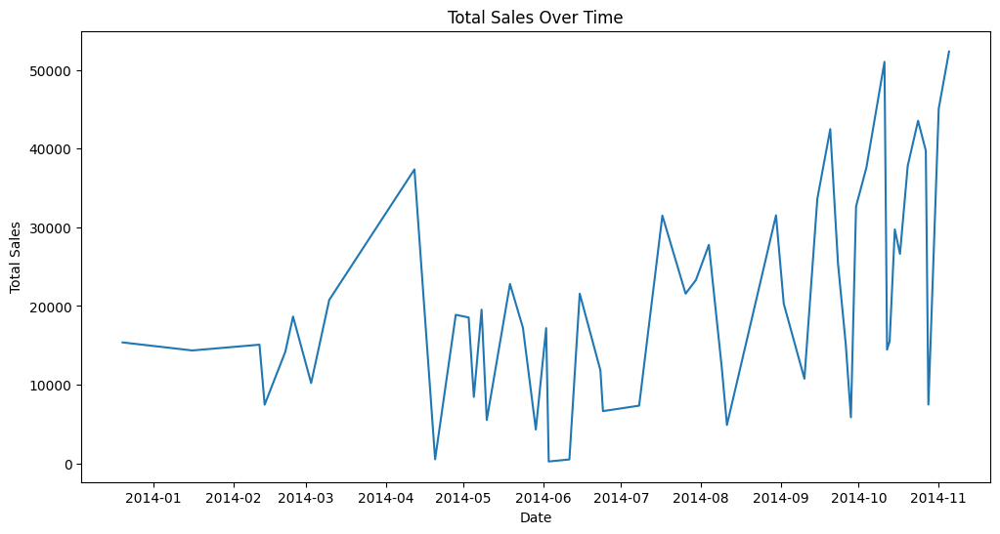

In [204]:
import pandas as pd
import matplotlib.pyplot as plt

# 데이터 준비 (df2_copy의 Date와 Price 열 사용)
# 예시 데이터프레임, 실제 데이터프레임에 맞게 수정해야 합니다.
# df2_copy = pd.DataFrame({'Date': ['2021-01-01', '2021-01-02'], 'Price': [100, 150]})

# 날짜 형식 확인 및 변환
df2_copy['Date'] = pd.to_datetime(df2_copy['Date'])

# 날짜별 판매액 집계
sales_by_date = df2_copy.groupby('Date')['PriceBTC'].sum().reset_index()

# 시계열 그래프
plt.figure(figsize=(12, 6))
plt.plot(sales_by_date['Date'], sales_by_date['PriceBTC'])
plt.title('Total Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.show()


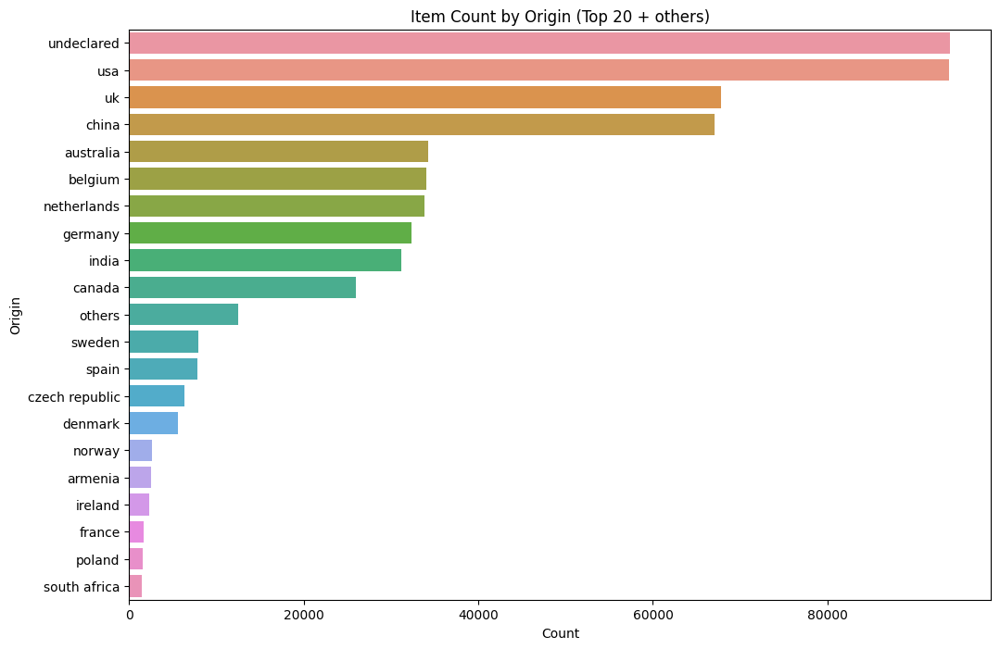

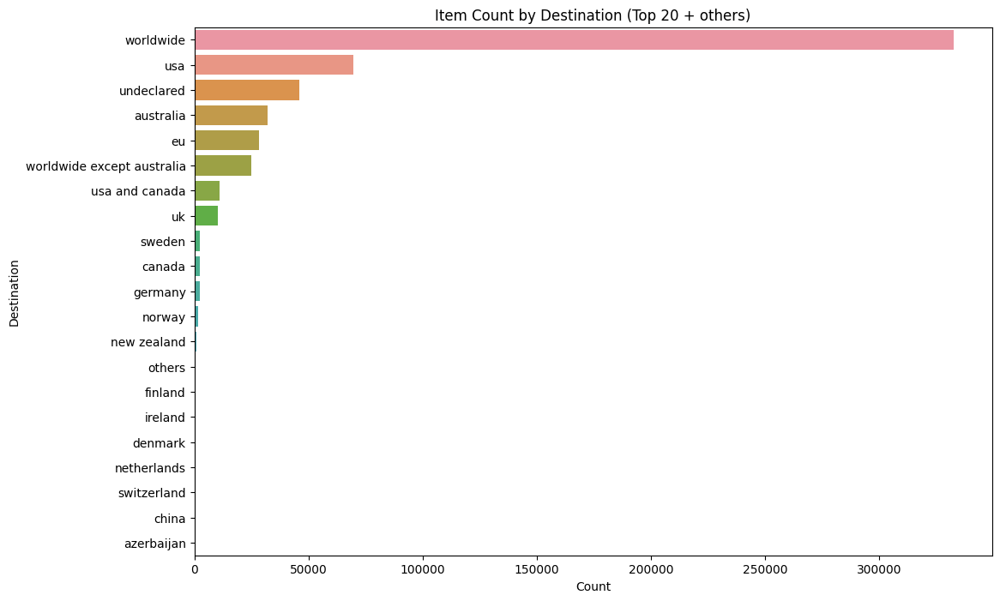

In [197]:
def top_20_others(series):
    top_20 = series.value_counts().head(20)
    return series.apply(lambda x: x if x in top_20 else 'others')

# Item Count by Origin
df2_copy['Origin_top20'] = top_20_others(df2_copy['Origin'])
origin_count_top20 = df2_copy['Origin_top20'].value_counts()
plt.figure(figsize=(12, 8))
sns.barplot(x=origin_count_top20.values, y=origin_count_top20.index)
plt.title('Item Count by Origin (Top 20 + others)')
plt.xlabel('Count')
plt.ylabel('Origin')
plt.show()

# Item Count by Destination
df2_copy['Destination_top20'] = top_20_others(df2_copy['Destination'])
destination_count_top20 = df2_copy['Destination_top20'].value_counts()
plt.figure(figsize=(12, 8))
sns.barplot(x=destination_count_top20.values, y=destination_count_top20.index)
plt.title('Item Count by Destination (Top 20 + others)')
plt.xlabel('Count')
plt.ylabel('Destination')
plt.show()



In [393]:
df_copy.Vendor.value_counts()

Vendor
optiman            874
sexyhomer          858
mssource           820
profesorhouse      804
RXChemist          728
                  ... 
canadaguy            1
TripWithScience      1
USAShroomz           1
DivineCubensis       1
GermanGBL            1
Name: count, Length: 3183, dtype: int64

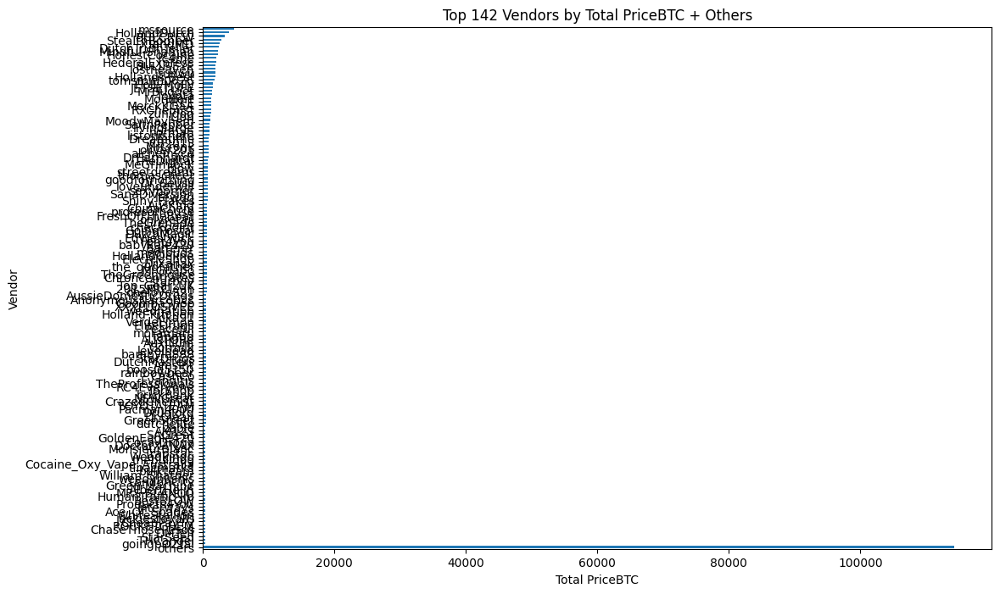

In [394]:
import pandas as pd
import matplotlib.pyplot as plt

# Vendor 별 PriceBTC 총합 계산
total_pricebtc_by_vendor = df_copy.groupby('Vendor')['PriceBTC'].sum().sort_values(ascending=False)

# 전체 판매액의 절반 계산
half_total_sales = total_pricebtc_by_vendor.sum() / 2

# 상위 N명의 누적 판매액이 전체 판매액의 절반을 넘는 지점 찾기
cumulative_sales = 0
for n, sales in enumerate(total_pricebtc_by_vendor):
    cumulative_sales += sales
    if cumulative_sales >= half_total_sales:
        break

# 필요한 N값
top_n_vendors = n + 1

# 상위 N명과 나머지로 데이터 나누기
top_vendors = total_pricebtc_by_vendor.head(top_n_vendors)
others_total = total_pricebtc_by_vendor.iloc[top_n_vendors:].sum()
top_vendors['others'] = others_total

# 가로 막대 그래프 시각화
plt.figure(figsize=(12, 8))
top_vendors.plot(kind='barh')
plt.title(f'Top {top_n_vendors} Vendors by Total PriceBTC + Others')
plt.xlabel('Total PriceBTC')
plt.ylabel('Vendor')
plt.gca().invert_yaxis()  # y축 순서 뒤집기
plt.show()


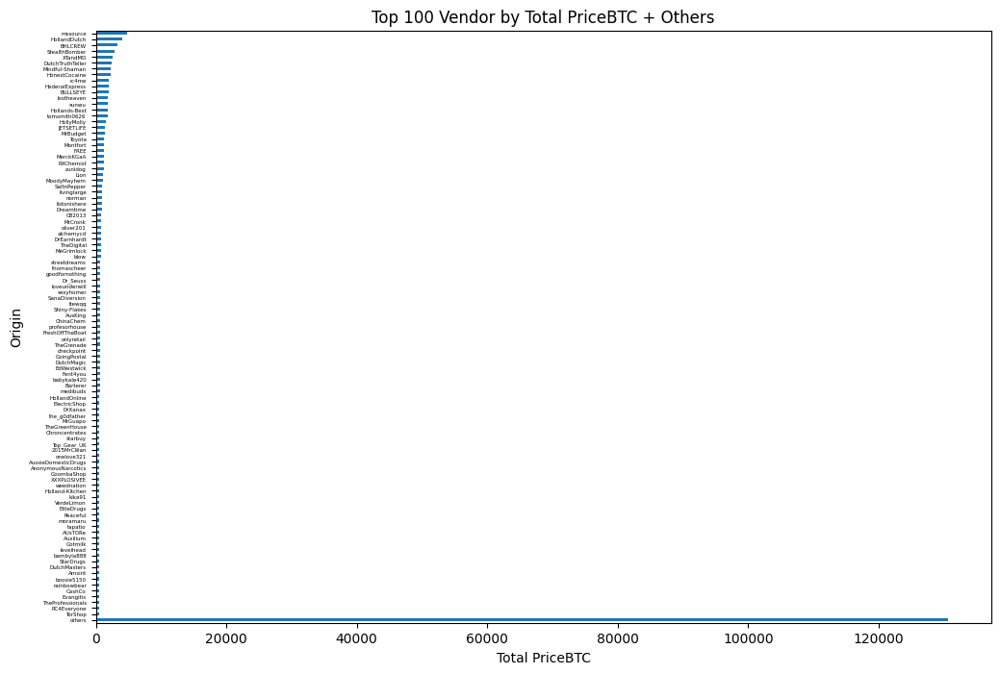

In [388]:
# Origin 별 PriceBTC 총합 계산
total_pricebtc_by_origin = df2_copy.groupby('Vendor')['PriceBTC'].sum().sort_values(ascending=False)

# 상위 20개 국가 추출
top_20_origins = total_pricebtc_by_origin.head(100)

# 나머지 'Others'로 묶기
others_total = total_pricebtc_by_origin.iloc[100:].sum()
top_20_origins['others'] = others_total

plt.figure(figsize=(12, 8))
top_20_origins.plot(kind='barh', linewidth=250)  # 바의 굵기를 10으로 설정
plt.title('Top 100 Vendor by Total PriceBTC + Others')
plt.xlabel('Total PriceBTC')
plt.ylabel('Origin')
plt.gca().invert_yaxis()  # y축 순서 뒤집기
plt.tick_params(axis='x')  # x축 레이블 크기를 10으로 조절
plt.tick_params(axis='y', labelsize=4)  # y축 레이블 크기를 10으로 조절
plt.show()




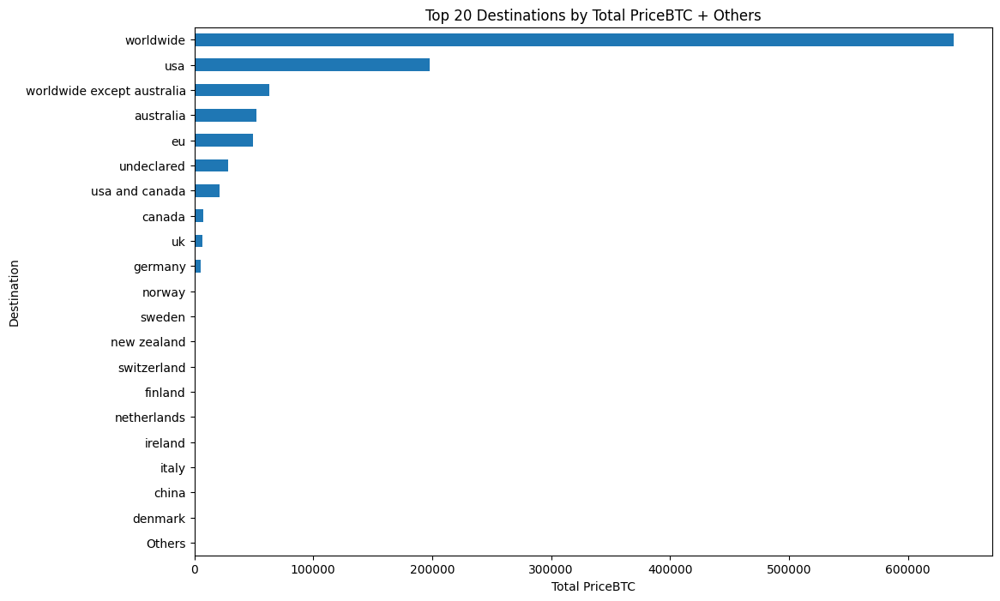

In [193]:
# Origin 별 PriceBTC 총합 계산
total_pricebtc_by_origin = df2_copy.groupby('Destination')['PriceBTC'].sum().sort_values(ascending=False)

# 상위 20개 국가 추출
top_20_origins = total_pricebtc_by_origin.head(20)

# 나머지 'Others'로 묶기
others_total = total_pricebtc_by_origin.iloc[20:].sum()
top_20_origins['Others'] = others_total

# 가로 막대 그래프 시각화
plt.figure(figsize=(12, 8))
top_20_origins.plot(kind='barh')
plt.title('Top 20 Destinations by Total PriceBTC + Others')
plt.xlabel('Total PriceBTC')
plt.ylabel('Destination')
plt.gca().invert_yaxis()  # y축 순서 뒤집기
plt.show()


In [185]:
df_copy.groupby('Origin')['PriceBTC'].sum().sort_values(ascending=False).head(25)

Origin
usa                              61995.3838682773
germany                          28065.5730178048
netherlands                      26130.1456534781
australia                        18612.7687985102
china                            13776.7771431099
uk                               13746.2428515233
canada                           11657.9227628179
worldwide                         8207.1239005354
eu                                6345.0271627239
internet                          2624.9859980558
belgium                           1722.0818314708
india                             1476.4756749117
sweden                            1101.7442117212
france                             984.6668223235
italy                              934.0921697200
undeclared                         748.4213721211
argentina                          736.7875727870
usa canada uk europe australia     712.2572922651
mexico                             691.4070477624
spain                              604.0294

In [181]:
total_price_origin

Origin
usa                              61995.3838682773
germany                          28065.5730178048
netherlands                      26130.1456534781
australia                        18612.7687985102
china                            13776.7771431099
uk                               13746.2428515233
canada                           11657.9227628179
worldwide                         8207.1239005354
eu                                6345.0271627239
internet                          2624.9859980558
belgium                           1722.0818314708
india                             1476.4756749117
sweden                            1101.7442117212
france                             984.6668223235
italy                              934.0921697200
undeclared                         748.4213721211
argentina                          736.7875727870
usa canada uk europe australia     712.2572922651
mexico                             691.4070477624
spain                              604.0294

In [123]:
from ydata_profiling import ProfileReport

# data report
profile = ProfileReport(df2_copy, minimal=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [316]:
# Vendor별 Total Sales (TS) 계산
total_sales = df2_copy.groupby('Vendor')['PriceBTC'].sum()

# Vendor별 Number of Items (NoI) 계산
number_of_items = df2_copy.groupby('Vendor').size()

# Vendor별 평균 Rating 계산
average_rating = df2_copy.groupby('Vendor')['Rating'].mean()

# Vendor별 Number of Categories (NoC) 계산
number_of_categories = df2_copy.groupby('Vendor')['Category'].nunique()

# 새로운 데이터프레임 생성
vendor_df2 = pd.DataFrame({
    'Vendor': total_sales.index,
    'TS': total_sales.values,
    'NoI': number_of_items.values,
    'Rating': average_rating.values,
    'NoC': number_of_categories.values
})

# Rating 열의 null 값들을 나머지 Rating 값들의 평균으로 채우기
vendor_df2['Rating'] = vendor_df2['Rating'].fillna(vendor_df2['Rating'].mean())

vendor_df2['Rating'] = vendor_df2['Rating'] + 1 # 제곱근 변환시에 1 이하 값 계산 / 로그변환 가능하게 

# # 0이 아닌 Rating 값들의 평균 계산
# rating_mean = vendor_df2[vendor_df['Rating'] != 0]['Rating'].mean()

# # Rating 열의 0 값을 평균값으로 변경
# vendor_df2['Rating'] = np.where(vendor_df['Rating'] == 0, rating_mean, vendor_df2['Rating'])

# # Rating 열의 0 값을 0.5로 변경
# vendor_df2['Rating'] = np.where(vendor_df['Rating'] == 0, 2.5, vendor_df2['Rating'])

# 결과 확인
vendor_df2.sort_values('TS', ascending=False)

,Vendor,TS,NoI,Rating,NoC
1190,rc4me,97037.0544770000,27975,3.2412403932,50
340,HonestCocaine,84972.3662470000,819,4.9365079365,2
664,SunWu-INT,84902.5921470000,3250,2.3152307692,12
403,Lucky Cat,50339.6251800000,10532,3.8133687809,29
958,drzheng,40699.6566910000,6120,3.2678349673,33
...,...,...,...,...,...
1084,litescape,0.0384060000,2,1.0000000000,0
999,gene001,0.0269700000,1,1.0000000000,1
1249,subsidio,0.0120220000,3,1.0000000000,0
739,Tonny's shop,0.0044890000,1,1.0000000000,0


In [317]:
# 'Vendor' 별로 'PriceBTC'의 총합 계산
vendor_total_price = df2_copy.groupby('Vendor')['PriceBTC'].sum()

# 결과 출력
vendor_total_price.sort_values(ascending=False).head()

Vendor
rc4me           97037.0544770000
HonestCocaine   84972.3662470000
SunWu-INT       84902.5921470000
Lucky Cat       50339.6251800000
drzheng         40699.6566910000
Name: PriceBTC, dtype: float64

In [333]:
# 극단값을 제거해보자
for column in vendor_df2.columns:
    if vendor_df2[column].dtype in ['float64', 'int64']:
        Q1 = vendor_df2[column].quantile(0.25)
        Q3 = vendor_df2[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # 이상치가 아닌 데이터만 필터링
        vendor_df2 = vendor_df2[(vendor_df2[column] >= lower_bound) & (vendor_df2[column] <= upper_bound)]

# 결과 확인
vendor_df2.describe()

,TS,NoI,Rating,NoC,Rating_boxcox
count,965.0000000000,965.0000000000,965.0000000000,965.0000000000,965.0000000000
mean,71.9132957689,107.0911917098,2.3260141649,2.8880829016,0.5763706186
std,111.6303932225,116.4321075084,1.5934946853,1.9890553632,0.6270486965
min,0.0034000000,1.0000000000,1.0000000000,0.0000000000,0.0000000000
25%,5.8224260000,23.0000000000,1.0000000000,1.0000000000,0.0000000000
50%,26.1372160000,60.0000000000,1.2246835443,2.0000000000,0.2007629210
75%,84.5564830000,154.0000000000,3.6197297297,4.0000000000,1.2116277030
max,651.0791530000,542.0000000000,5.7833333333,8.0000000000,1.6177970867


In [334]:
vendor_df2

,Vendor,TS,NoI,Rating,NoC,Rating_boxcox
0,$220for28grams,25.0582390000,56,3.0535714286,3,1.0597102364
1,*REALDEAL*,34.5871460000,39,2.8038461538,2,0.9825848146
2,-BIGG-BALLs-,7.5170140000,117,4.4837606838,3,1.3994010141
3,-ThePakistani-,18.7064080000,71,2.9936619718,4,1.0418539199
4,03welle,119.3642990000,524,3.3337786260,5,1.1384293046
...,...,...,...,...,...,...
1327,xinhai,14.6390170000,26,1.0000000000,4,0.0000000000
1328,xodna,6.1376500000,24,5.3416666667,3,1.5501896821
1330,yeehaa123,4.8254780000,3,1.0000000000,0,0.0000000000
1331,yoloids,10.8792000000,30,3.1233333333,1,1.0800262709


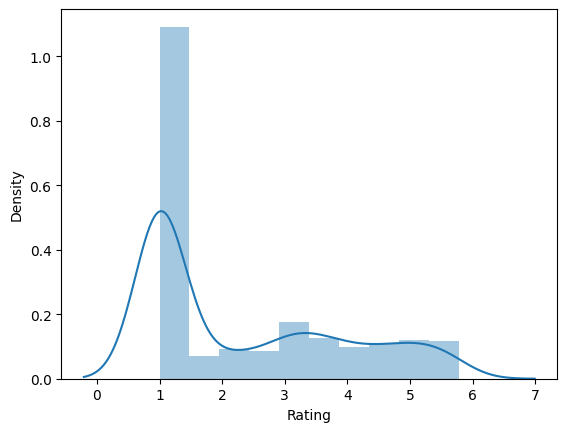

In [335]:
sns.distplot(vendor_df2['Rating'])
plt.show()

In [336]:
# 로그변환 for right skewed
TS_log = np.log(vendor_df2['TS'])
NoI_log = np.log(vendor_df2['NoI'])
Rating_log = np.log(vendor_df2['Rating']) # left skewed
NoC_log = np.log(vendor_df2['NoC'])

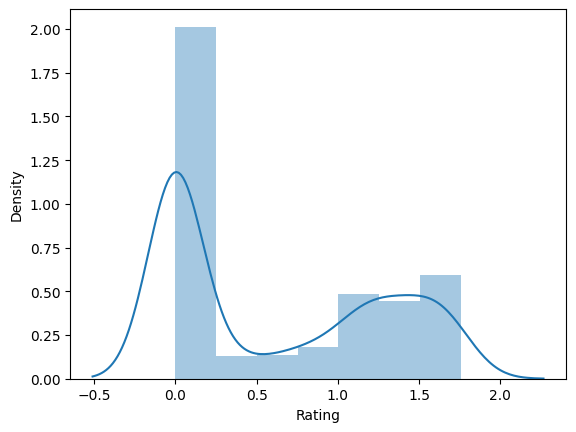

In [337]:
sns.distplot(Rating_log);

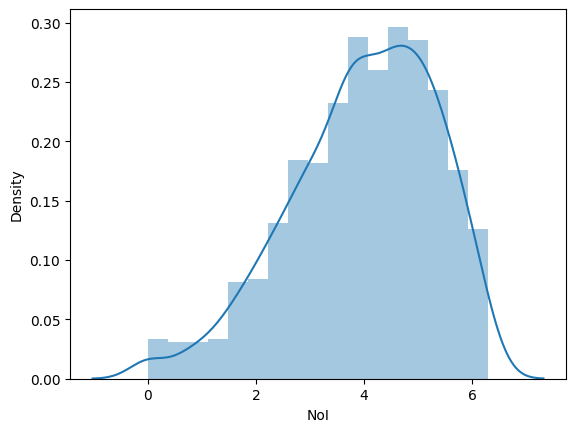

In [338]:
sns.distplot(NoI_log);

In [339]:
# 제곱근 변환
Rating_sqrt = np.sqrt(vendor_df2['Rating'])

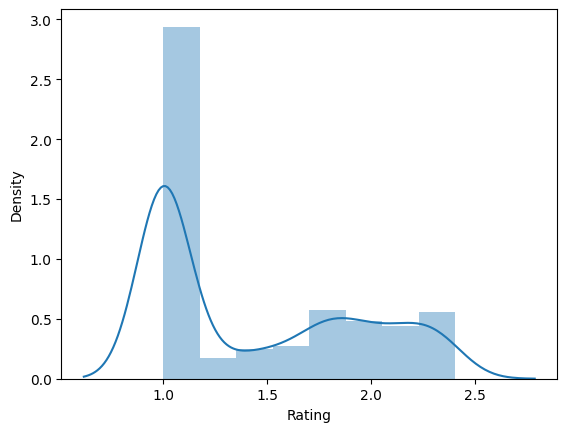

In [340]:
sns.distplot(Rating_sqrt);

In [341]:
# Box-Cox 변환 (0 이상의 값이어야 함)
vendor_df2['Rating_boxcox'], _ = stats.boxcox(vendor_df2['Rating'])

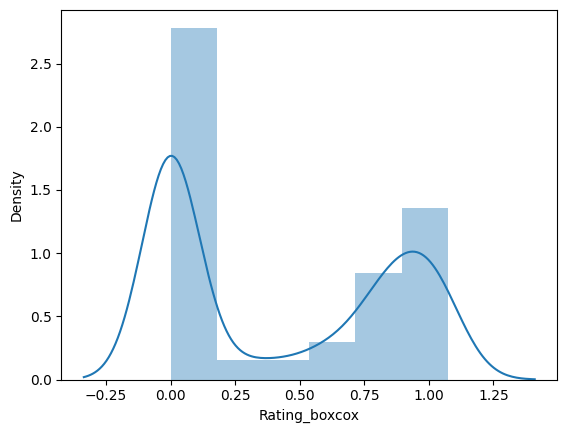

In [342]:
sns.distplot(vendor_df2['Rating_boxcox']);

In [343]:
log_vendor2_df = pd.concat([TS_log, NoI_log, Rating_log], axis=1)
log_vendor2_df

,TS,NoI,Rating
0,3.2212026757,4.0253516907,1.1163118658
1,3.5434821101,3.6635616461,1.0309921010
2,2.0171689846,4.7621739348,1.5004621326
3,2.9288661390,4.2626798770,1.0964973778
4,4.7821801529,6.2614916843,1.2041063832
...,...,...,...
1327,2.6836903615,3.2580965380,0.0000000000
1328,1.8144419327,3.1780538303,1.6755377141
1330,1.5739097972,1.0986122887,0.0000000000
1331,2.3868527093,3.4011973817,1.1389008076


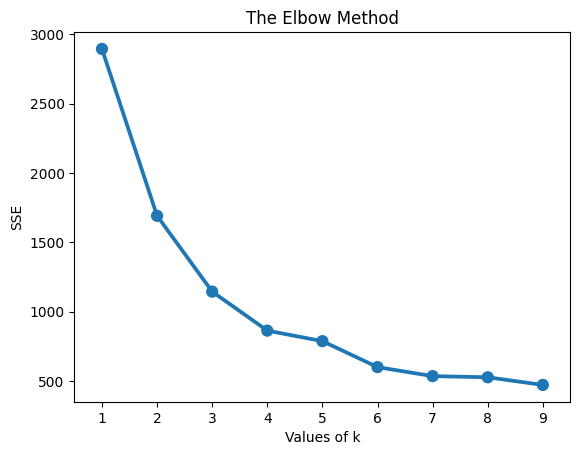

In [344]:
# 클러스터링

# 표준화
scaler = StandardScaler()
vendor2_scaled = scaler.fit_transform(log_vendor2_df)

sse = {}
for k in range(1,10):
  kmeans = KMeans(n_clusters=k, random_state=1)
  kmeans.fit(vendor2_scaled)
  sse[k] = kmeans.inertia_

# 결과 시각화 
plt.title('The Elbow Method')
plt.xlabel('Values of k')
plt.ylabel('SSE')
sns.pointplot(x=list(sse.keys()), y=list(sse.values()))
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.3629693160550195
For n_clusters = 3 The average silhouette_score is : 0.3777784879518357
For n_clusters = 4 The average silhouette_score is : 0.4005663919465905
For n_clusters = 5 The average silhouette_score is : 0.3899837481351626
For n_clusters = 6 The average silhouette_score is : 0.3495370235850786
For n_clusters = 7 The average silhouette_score is : 0.3548327597045188
For n_clusters = 8 The average silhouette_score is : 0.31969022510304806
For n_clusters = 9 The average silhouette_score is : 0.29555860509582005


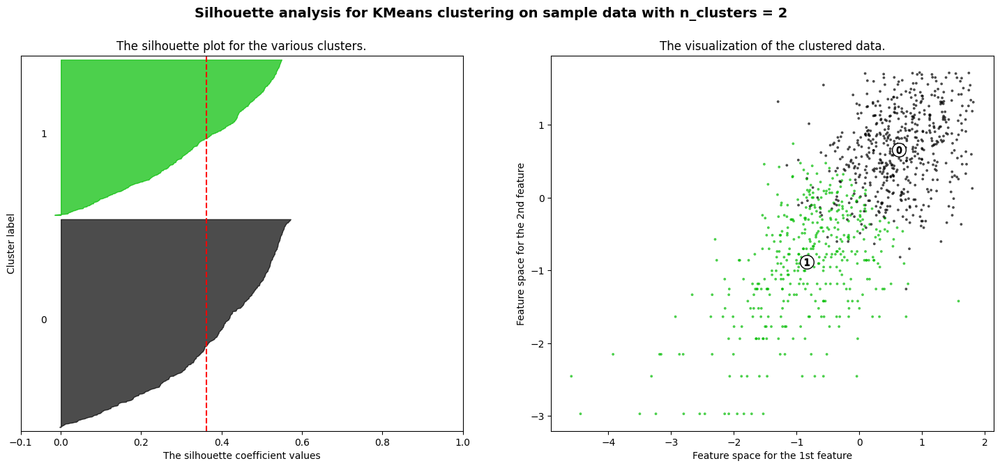

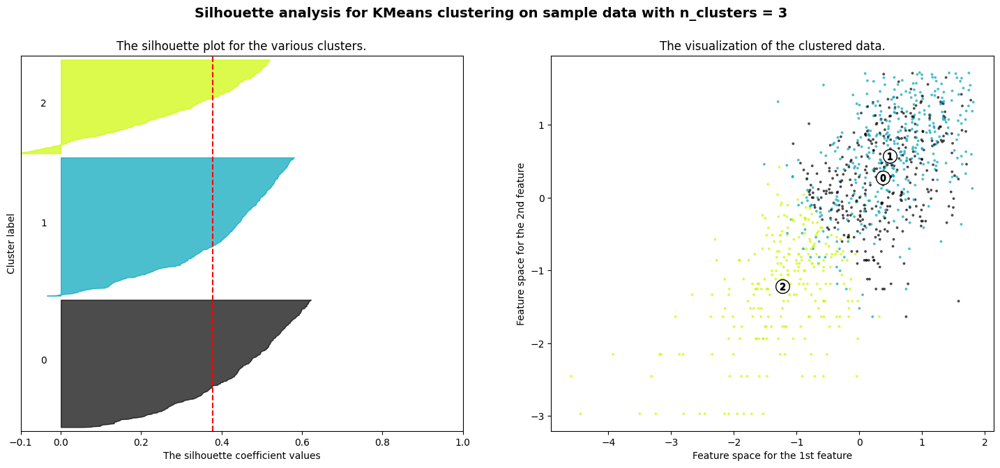

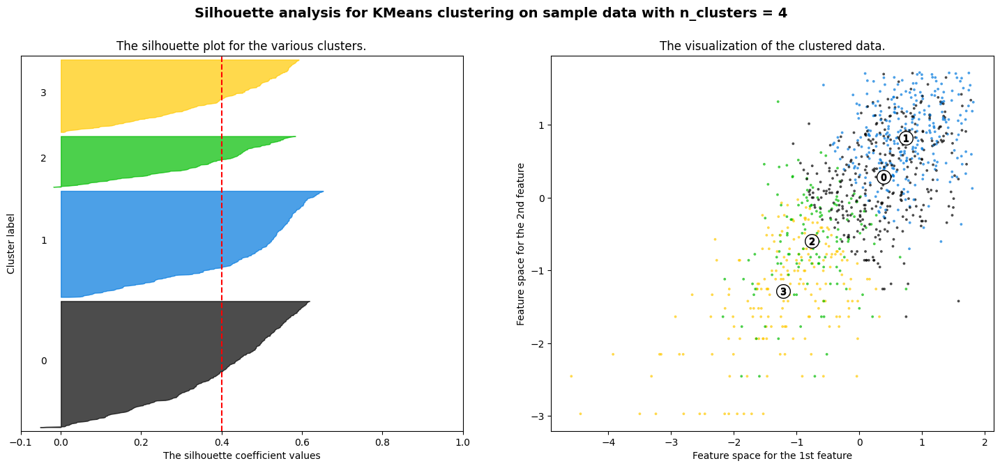

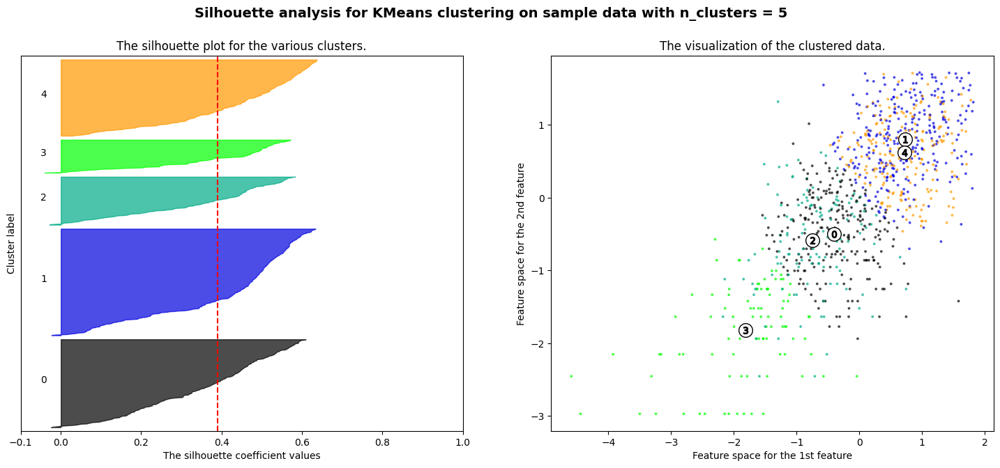

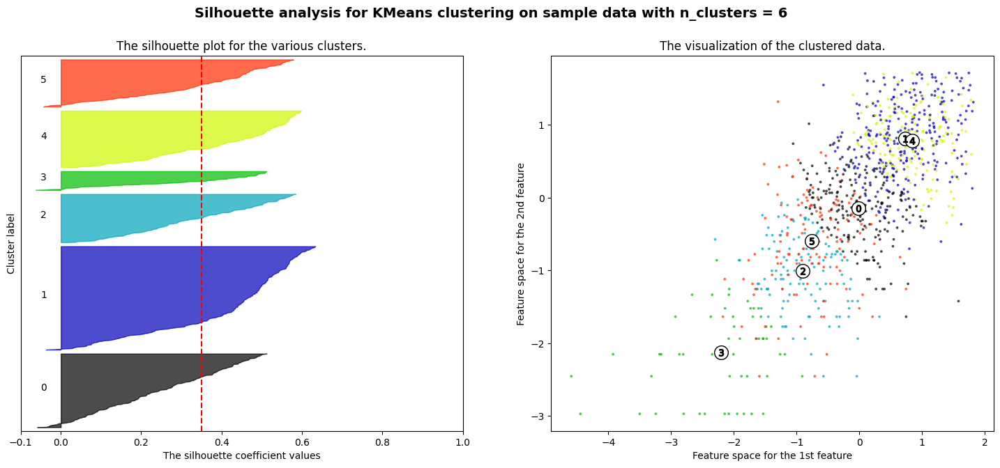

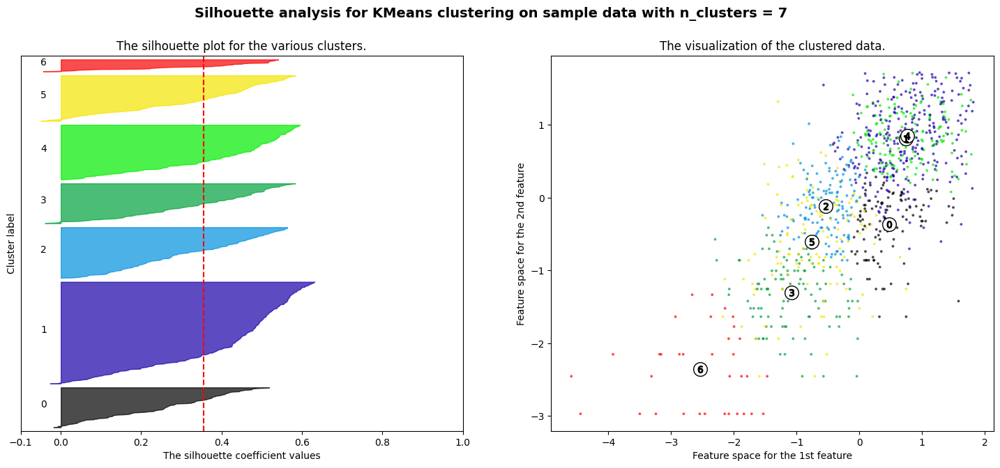

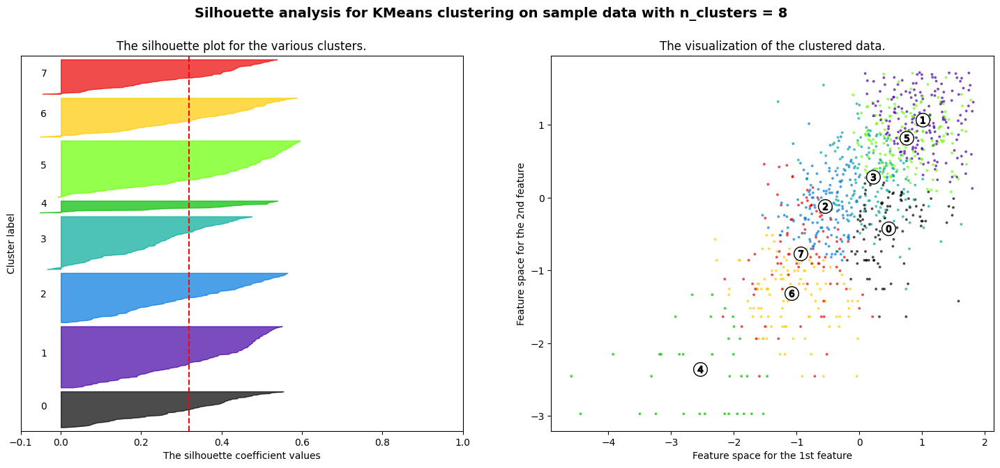

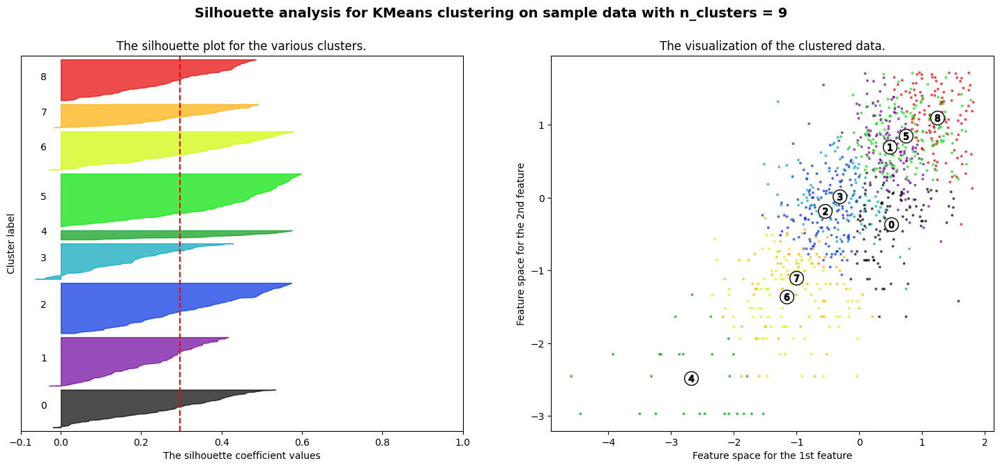

In [345]:
# Silhouette method 결과 시각화

x = vendor2_scaled

for n_clusters in range(2,10):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(x) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(x)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(x, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(x, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(x[:, 0], x[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [348]:
# 최종 모델 학습
kmeans = KMeans(n_clusters=4, max_iter=50, random_state=42)
kmeans.fit(vendor2_scaled)

# Vendor별 클러스터 지정
cluster_labels = kmeans.labels_

vendor_df2_k2 = vendor_df2.assign(Cluster = cluster_labels)

In [349]:
vendor_df2_k2

,Vendor,TS,NoI,Rating,NoC,Rating_boxcox,Cluster
0,$220for28grams,25.0582390000,56,3.0535714286,3,0.8078936389,2
1,*REALDEAL*,34.5871460000,39,2.8038461538,2,0.7637706333,2
2,-BIGG-BALLs-,7.5170140000,117,4.4837606838,3,0.9802591269,2
3,-ThePakistani-,18.7064080000,71,2.9936619718,4,0.7978517976,2
4,03welle,119.3642990000,524,3.3337786260,5,0.8509456666,3
...,...,...,...,...,...,...,...
1327,xinhai,14.6390170000,26,1.0000000000,4,0.0000000000,1
1328,xodna,6.1376500000,24,5.3416666667,3,1.0462950521,2
1330,yeehaa123,4.8254780000,3,1.0000000000,0,0.0000000000,0
1331,yoloids,10.8792000000,30,3.1233333333,1,0.8191934423,2


In [350]:
vendor_df2_k2.groupby(['Cluster']).agg({
    'TS': 'mean',
    'NoI': 'mean',
    'Rating': 'mean',
    'NoC': ['mean','count']
})

TS            NoI       Rating          NoC      
                  mean           mean         mean         mean count
Cluster                                                              
0         4.3726647979  13.6632124352 1.0423979473 1.5958549223   193
1        80.0340667493 109.6195965418 1.0865112679 3.2824207493   347
2        10.3938195338  36.3040540541 3.9662815326 1.9121621622   148
3       141.6689518339 206.8411552347 3.8967212581 3.8158844765   277

In [143]:
# 클러스터별로 총판매량, 총판매아이템 갯수의 평균에서 차이가 남.

In [144]:
# 'Cluster' 열을 'ActivityIndex'로 이름 변경하고, 값을 'low', 'mid', 'high'로 변환
vendor_df2_k2['ActivityIndex'] = vendor_df2_k2['Cluster'].map({0: 'low', 1: 'high'})

# 'ActivityIndex' 열을 vendor_df에 추가
vendor_df2['ActivityIndex'] = vendor_df2_k2['ActivityIndex']

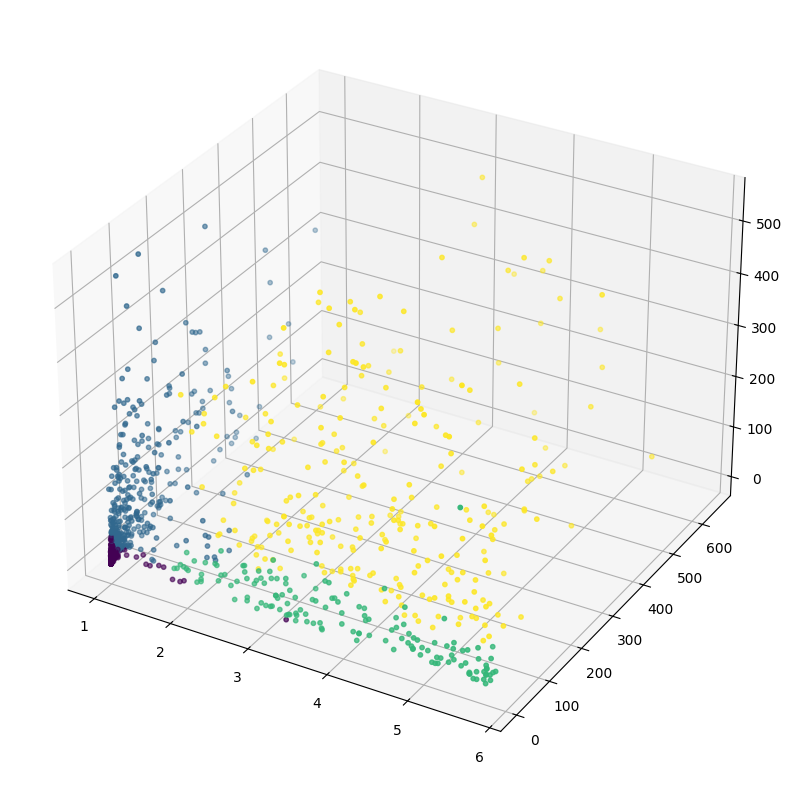

In [351]:
fig = plt.figure(figsize = (13,10))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(xs = vendor_df2_k2.Rating, ys = vendor_df2_k2.TS, zs = vendor_df2_k2.NoI, c=vendor_df2_k2.Cluster
           ,s=10)

plt.show()

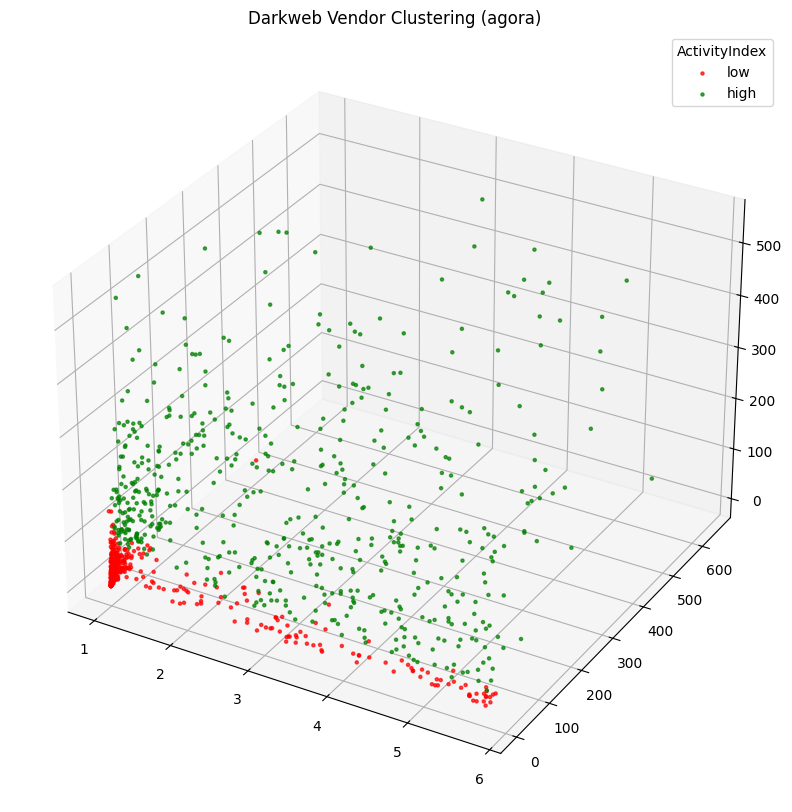

In [146]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(13, 10))
ax = fig.add_subplot(111, projection='3d')

# 클러스터별로 색상을 다르게 하여 산점도 그리기
colors = ['red', 'green']
labels = ['low', 'high']

for i in range(2):
    ax.scatter(xs=vendor_df2_k2[vendor_df2_k2.Cluster == i].Rating, 
               ys=vendor_df2_k2[vendor_df2_k2.Cluster == i].TS, 
               zs=vendor_df2_k2[vendor_df2_k2.Cluster == i].NoI, 
               c=colors[i], 
               label=labels[i], 
               alpha=0.7,
               s=5)
# 범례 추가
ax.legend(title='ActivityIndex')
ax.set_title('Darkweb Vendor Clustering (agora)')
# 표시
plt.show()

                                      count         mean           std  \
Category                                                                 
Biotic/Materials              66.0000000000 0.2955510303  0.8852814086   
Cannabis/Clones               37.0000000000 4.0213074595  4.7654721697   
Cannabis/Concentrates       7739.0000000000 1.2058354981  3.8493872611   
Cannabis/Cuttings             64.0000000000 0.4569463750  0.7069558284   
Cannabis/Edibles            3493.0000000000 0.5064090673  5.0878036386   
...                                     ...          ...           ...   
Stimulants/Mdpv             1867.0000000000 1.2829283776  2.3196675994   
Stimulants/Mephedrone       1723.0000000000 2.7034862600 11.1636824643   
Stimulants/Methamphetamine  6084.0000000000 2.3140816185  5.2180305812   
Stimulants/Pentedrone       1163.0000000000 2.3366690034  2.4797627823   
Stimulants/Speed           13053.0000000000 1.2838789960  4.1604925551   

                                    m

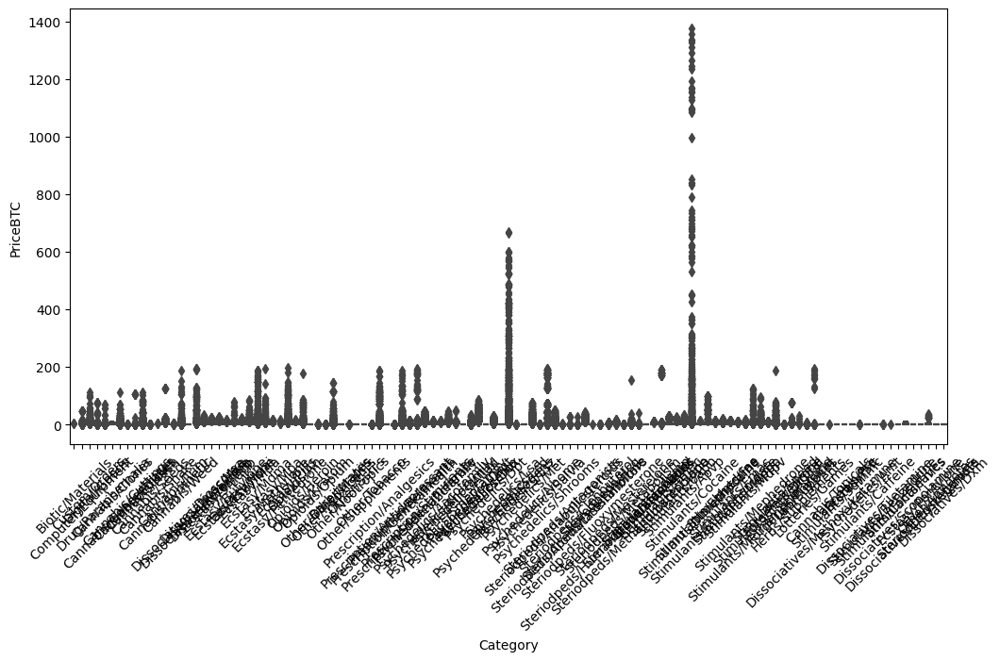

ANOVA Test: F-value = nan , P-value = nan


In [147]:
# 그룹별 기술통계
grouped = df2_copy.groupby('Category')['PriceBTC']
print(grouped.describe())

# 상자 그림
plt.figure(figsize=(12, 6))
sns.boxplot(x='Category', y='PriceBTC', data=df2_copy)
plt.xticks(rotation=45)
plt.show()

# ANOVA 테스트
# 'Category'의 고유값이 많을 경우, 일부 대표적인 범주를 선택하여 분석
categories = df['Category'].unique()
if len(categories) > 5:
    categories = categories[:5]  # 예시: 첫 5개 범주 사용

anova_data = [df2_copy[df2_copy['Category'] == cat]['PriceBTC'].dropna() for cat in categories]
f_val, p_val = stats.f_oneway(*anova_data)
print("ANOVA Test: F-value =", f_val, ", P-value =", p_val)

In [168]:
# 'Category'를 '/'를 기준으로 분리
split_categories = df2_copy['Category'].str.split('/', expand=True)
df2_copy['Level1'] = split_categories[0]
df2_copy['Level2'] = split_categories[1]

# 레벨별 ANOVA 수행
def perform_anova(level):
    groups = df2_copy.groupby(level)['PriceBTC']
    anova_data = [group.dropna() for name, group in groups]
    f_val, p_val = stats.f_oneway(*anova_data)
    print(f"ANOVA for {level}: F-value = {f_val}, P-value = {p_val}")

perform_anova('Level1')
perform_anova('Level2')

ANOVA for Level1: F-value = 99.0780278139521, P-value = 0.0
ANOVA for Level2: F-value = 40.523656158040254, P-value = 0.0


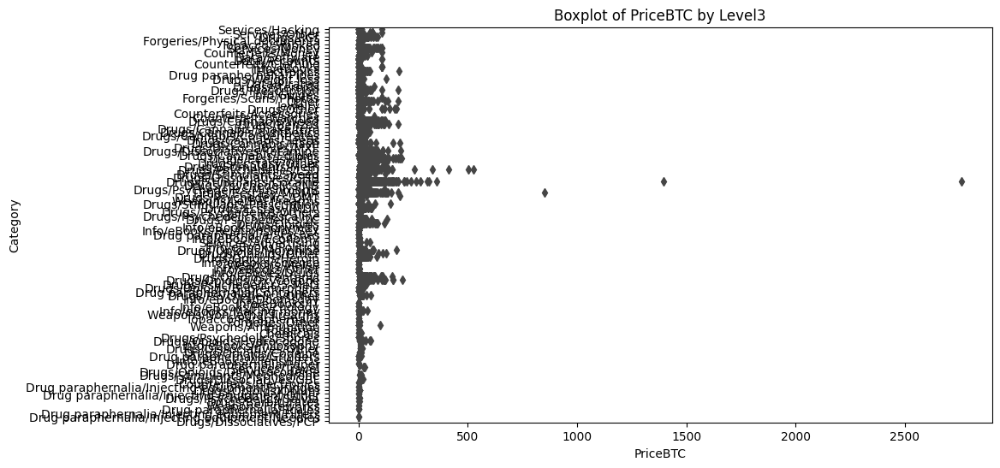

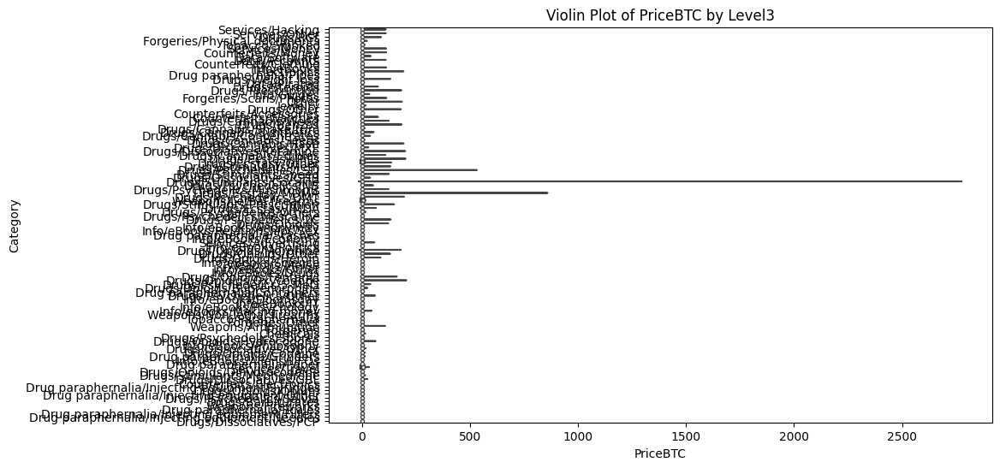

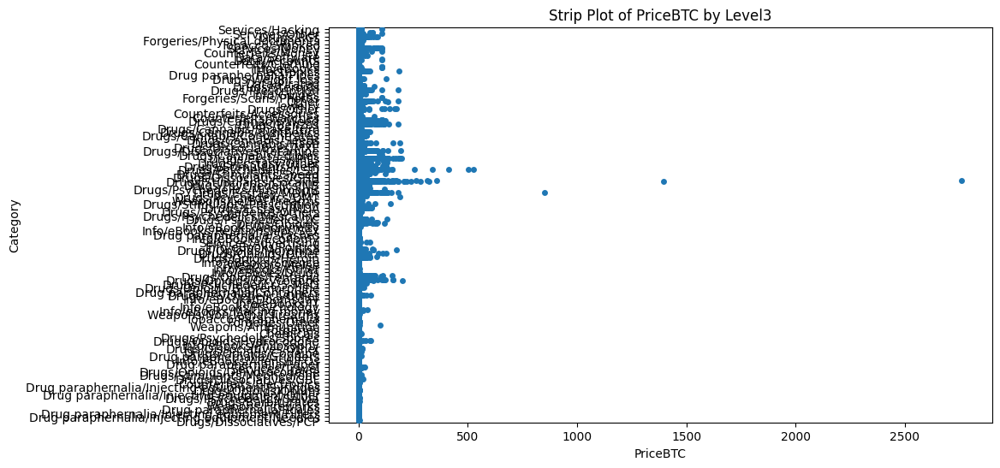

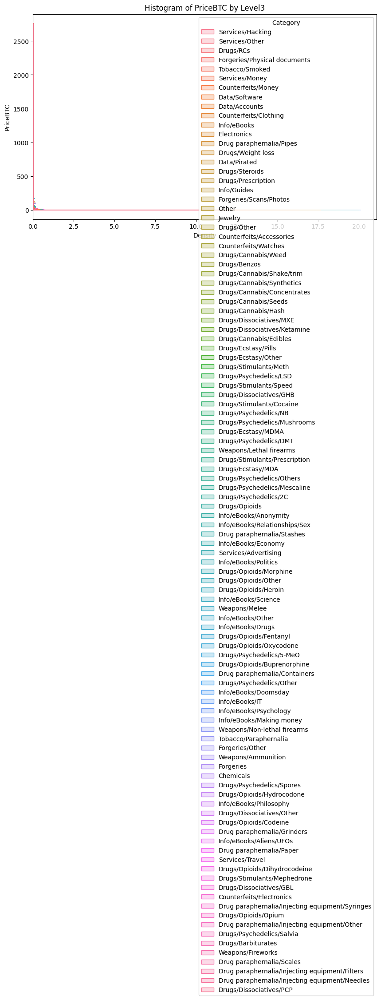

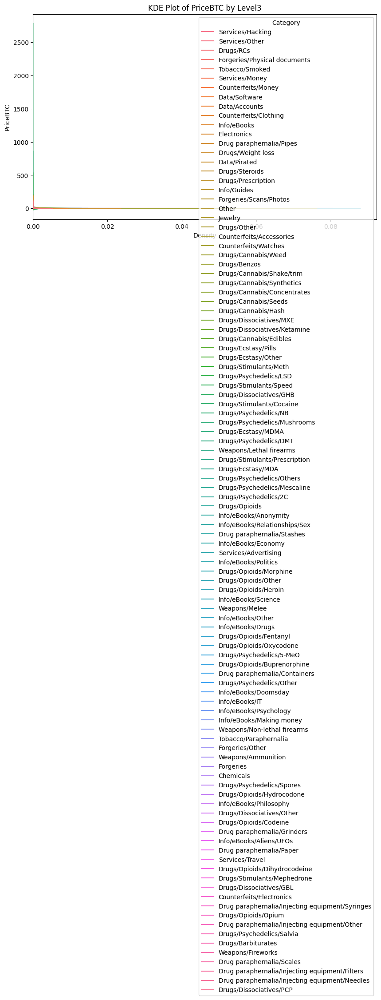

In [167]:
import matplotlib.pyplot as plt
import seaborn as sns

# 박스 플롯
plt.figure(figsize=(10, 6))
sns.boxplot(x='PriceBTC', y='Category', data=df_copy)
plt.title('Boxplot of PriceBTC by Level3')
plt.show()

# 바이올린 플롯
plt.figure(figsize=(10, 6))
sns.violinplot(x='PriceBTC', y='Category', data=df_copy)
plt.title('Violin Plot of PriceBTC by Level3')
plt.show()

# 스트립 플롯
plt.figure(figsize=(10, 6))
sns.stripplot(x='PriceBTC', y='Category', data=df_copy, jitter=True)
plt.title('Strip Plot of PriceBTC by Level3')
plt.show()

# 히스토그램
plt.figure(figsize=(10, 6))
sns.histplot(data=df_copy, y='PriceBTC', hue='Category', element='step', stat='density', common_norm=False)
plt.title('Histogram of PriceBTC by Level3')
plt.show()

# KDE 플롯
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df_copy, y='PriceBTC', hue='Category')
plt.title('KDE Plot of PriceBTC by Level3')
plt.show()


In [289]:
df2_copy

,Item,Vendor,PriceUSD,PriceBTC,Rating,Reviews,Origin,Destination,Category,Date,Level1,Level2,Origin_top20,Destination_top20
0,ray ban tech rb3460 001 aviator flip sunglasse...,FoxyGirl,61.1615418288,0.0982320000,0.0000000000,0.0000000000,china,worldwide,Counterfeits/Accessories,2014-07-17,Counterfeits,Accessories,china,worldwide
1,ray ban rb3025 aviator classic sunglasses replica,FoxyGirl,37.9625939448,0.0609720000,0.0000000000,0.0000000000,china,worldwide,Counterfeits/Watches,2014-07-17,Counterfeits,Watches,china,worldwide
2,rolex watch box aaa grade replica,RepAAA,100.4297770434,0.1613010000,0.0000000000,0.0000000000,china,worldwide,Counterfeits/Watches,2014-07-17,Counterfeits,Watches,china,worldwide
3,ray ban rb3016 w0365 clubmaster sunglasses rep...,FoxyGirl,45.3437943518,0.0728270000,0.0000000000,0.0000000000,china,worldwide,Counterfeits/Accessories,2014-07-17,Counterfeits,Accessories,china,worldwide
4,rolex submariner 2tone yg ss black replica,RepAAA,149.6350817220,0.2403300000,0.0000000000,0.0000000000,china,worldwide,Counterfeits/Watches,2014-07-17,Counterfeits,Watches,china,worldwide
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
567214,10 000 real twitter followers,profesorhouse,69.5167779390,0.1799700000,4.8000000000,0.0000000000,belgium,undeclared,NaN,2014-09-30,NaN,NaN,belgium,undeclared
567215,500000 high retention views youtube,SideAlley,224.5924591967,0.5814410000,3.6500000000,0.0000000000,undeclared,undeclared,NaN,2014-09-30,NaN,NaN,undeclared,undeclared
567216,25 000 real twitter followers,profesorhouse,112.2964227327,0.2907210000,4.8000000000,0.0000000000,belgium,undeclared,NaN,2014-09-30,NaN,NaN,belgium,undeclared
567217,40000 facebook followers subscribers. cheap,SideAlley,77.0030516137,0.1993510000,3.6500000000,0.0000000000,undeclared,undeclared,NaN,2014-09-30,NaN,NaN,undeclared,undeclared


In [314]:
df2_sunburst.groupby('Level1')["PriceBTC"].sum().sort_values(ascending=False).head(50)

Level1
Unknown              306117.9393560000
Psychedelics         229707.8047810000
Stimulants           185630.0495870000
Ecstasy               99243.1220570000
Prescription          78993.5226540000
Cannabis              62193.6988740000
Steriodpeds           26855.5754090000
Other                 20281.8769500000
Dissociatives         15907.0723130000
Opioids               12455.0195310000
Drugs                 11831.7382440000
Custom                11462.5116490000
Digital                4210.0486880000
Forgeries              3596.2931420000
Lotteries              1964.8459560000
Computer               1639.7021340000
Drug                   1182.2604690000
Counterfeits            345.4875400000
Services                298.4697700000
Lab                     198.6870580000
Data                    108.7938490000
Herbs                    76.2916820000
Electronics              75.1512030000
Info                     57.1201240000
Weapons                  36.1588760000
Tobacco           

In [315]:
df2_sunburst.groupby('Level1')["PriceBTC"].sum().sum()

1074554.877895

In [284]:
split_categories = df_sunburst['Category'].str.split('/', expand=True)

In [306]:
# 레벨1, 레벨2, 레벨3을 결합하여 계층적 구조 생성
df2_sunburst = df2_copy.copy()

# df_no_drugs = df2_sunburst[df2_sunburst['Level1'] != 'Drugs']

df2_sunburst['Category'] = df2_sunburst['Category'].fillna('Unknown')

# 카테고리를 레벨별로 분리
split_categories = df2_sunburst['Category'].str.split('/', expand=True)
df2_sunburst['Level1'] = split_categories[0]
df2_sunburst['Level2'] = split_categories[1].fillna(df2_sunburst['Level1'])
df2_sunburst['Level3'] = split_categories[2].fillna(df2_sunburst['Level2'])
df2_sunburst['Level4'] = split_categories[3].fillna(df2_sunburst['Level3'])


# 레벨별 총 판매액 계산
df_grouped = df2_sunburst.groupby(['Level1', 'Level2', 'Level3', 'Level4']).size().reset_index(name='Count')

# 태양 플롯 생성
fig = px.sunburst(df_grouped, path=['Level1', 'Level2', 'Level3', 'Level4'], values='Count', color='Level3')
fig.update_layout(width=800, height=800, title='Sunburst Plot by Total PriceBTC')  # 차트 크기 조정
fig.show()

In [309]:
split_categories

,0,1,2,3
0,Counterfeits,Accessories,None,None
1,Counterfeits,Watches,None,None
2,Counterfeits,Watches,None,None
3,Counterfeits,Accessories,None,None
4,Counterfeits,Watches,None,None
...,...,...,...,...
567214,Unknown,None,None,None
567215,Unknown,None,None,None
567216,Unknown,None,None,None
567217,Unknown,None,None,None


In [312]:
# 레벨1, 레벨2, 레벨3을 결합하여 계층적 구조 생성
df2_sunburst = df2_copy.copy()

df2_sunburst['Category'] = df2_sunburst['Category'].fillna('Unknown')

# 카테고리를 레벨별로 분리
split_categories = df2_sunburst['Category'].str.split('/', expand=True)
df2_sunburst['Level1'] = split_categories[0]
df2_sunburst['Level2'] = split_categories[1].fillna(df2_sunburst['Level1']) 


# 레벨별 총 판매액 계산
df_grouped = df2_sunburst.groupby(['Level1', 'Level2']).agg({'PriceBTC': 'sum'}).reset_index()

# 태양 플롯 생성
fig = px.sunburst(df_grouped, path=['Level1', 'Level2'], values='PriceBTC', color='Level1')
fig.update_layout(width=800, height=800, title='Sunburst Plot by Total PriceBTC')  # 차트 크기 조정
fig.show()


In [ ]:
# 레벨1, 레벨2, 레벨3을 결합하여 계층적 구조 생성
df_sunburst = df2_copy.copy()

# 카테고리를 레벨별로 분리
split_categories = df_sunburst['Category'].str.split('/', expand=True)
df_sunburst['Level1'] = split_categories[0]
df_sunburst['Level2'] = split_categories[1].fillna(df_sunburst['Level1'])
df_sunburst['Level3'] = split_categories[2].fillna(df_sunburst['Level2'])

# 태양 플롯 생성
fig = px.sunburst(df_sunburst, path=['Level1', 'Level2', 'Level3'], color='Level2')
fig.update_layout(width=800, height=800, title='Sunburst Plot by Count')  # 차트 크기 조정
fig.show()

# 레벨별 총 판매액 계산
df_grouped = df_sunburst.groupby(['Level1', 'Level2', 'Level3']).agg({'PriceBTC': 'sum'}).reset_index()

# 태양 플롯 생성
fig = px.sunburst(df_grouped, path=['Level1', 'Level2', 'Level3'], values='PriceBTC', color='Level2')
fig.update_layout(width=800, height=800, title='Sunburst Plot by Total PriceBTC')  # 차트 크기 조정
fig.show()

In [273]:
# 카테고리를 레벨별로 분리
split_categories = df_sunburst['Category'].str.split('/', expand=True)
df_sunburst['Level1'] = split_categories[0]
df_sunburst['Level2'] = split_categories[1].fillna(df_sunburst['Level1'])
df_sunburst['Level3'] = split_categories[2].fillna(df_sunburst['Level2'])

# 레벨별 총 판매액 계산
df_grouped = df2_sunburst.groupby(['Level1', 'Level2']).agg({'PriceBTC': 'sum'}).reset_index()

# 태양 플롯 생성
fig = px.sunburst(df_grouped, path=['Level1', 'Level2'], values='PriceBTC', color='Level1')
fig.update_layout(width=800, height=800, title='Sunburst Plot by Total PriceBTC')  # 차트 크기 조정
fig.show()

In [276]:
df2_copy.groupby('Level1')['PriceBTC'].sum().sort_values(ascending=False).head(20)

Level1
Psychedelics    229707.8047810000
Stimulants      185630.0495870000
Ecstasy          99243.1220570000
Prescription     78993.5226540000
Cannabis         62193.6988740000
Steriodpeds      26855.5754090000
Other            20281.8769500000
Dissociatives    15907.0723130000
Opioids          12455.0195310000
Drugs            11831.7382440000
Custom           11462.5116490000
Digital           4210.0486880000
Forgeries         3596.2931420000
Lotteries         1964.8459560000
Computer          1639.7021340000
Drug              1182.2604690000
Counterfeits       345.4875400000
Services           298.4697700000
Lab                198.6870580000
Data               108.7938490000
Name: PriceBTC, dtype: float64

In [ ]:
# 'Drugs' 카테고리 제외
df_no_drugs = df_sunburst[df_sunburst['Level1'] != 'Drugs']

# 카테고리를 레벨별로 분리
split_categories = df_no_drugs['Category'].str.split('/', expand=True)
df_no_drugs['Level1'] = split_categories[0]
df_no_drugs['Level2'] = split_categories[1].fillna(df_no_drugs['Level1'])
df_no_drugs['Level3'] = split_categories[2].fillna(df_no_drugs['Level2'])

# 레벨별 총 판매액 계산
df_grouped_sum = df_no_drugs.groupby(['Level1', 'Level2', 'Level3']).agg({'PriceBTC': 'sum'}).reset_index()

# 레벨별 개수 계산
df_grouped_count = df_no_drugs.groupby(['Level1', 'Level2', 'Level3']).size().reset_index(name='Count')

# 태양 플롯 (PriceBTC 총합 기준)
fig_sum = px.sunburst(df_grouped_sum, path=['Level1', 'Level2', 'Level3'], values='PriceBTC', color='Level1')
fig_sum.update_layout(width=800, height=800, title='Sunburst Plot by Total PriceBTC (Excluding Drugs)')
fig_sum.show()

# 태양 플롯 (개수 기준)
fig_count = px.sunburst(df_grouped_count, path=['Level1', 'Level2', 'Level3'], values='Count', color='Level1')
fig_count.update_layout(width=800, height=800, title='Sunburst Plot by Count (Excluding Drugs)')
fig_count.show()

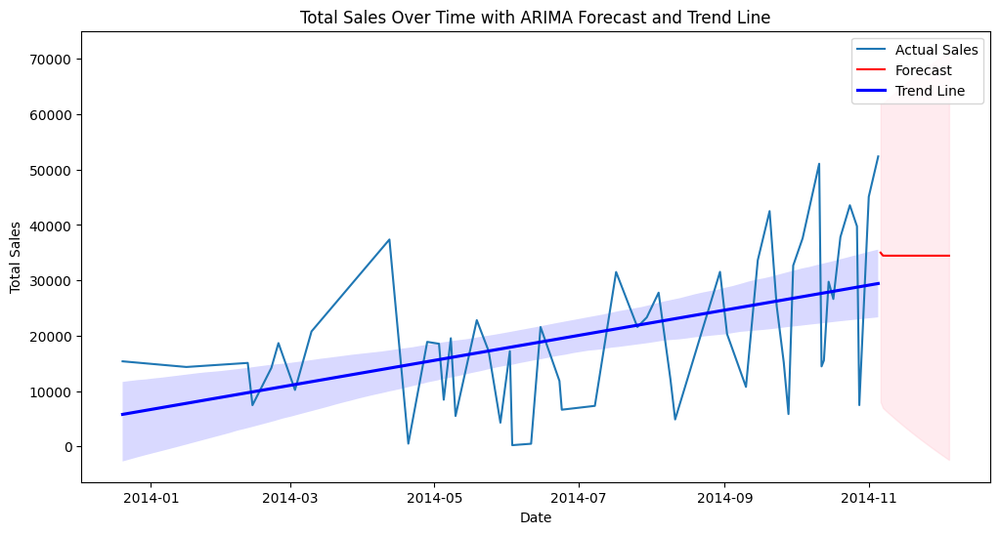

In [214]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA

# 데이터 준비 (df2_copy의 Date와 Price 열 사용)
# 예시 데이터프레임, 실제 데이터프레임에 맞게 수정해야 합니다.
# df2_copy = pd.DataFrame({'Date': ['2021-01-01', '2021-01-02'], 'Price': [100, 150]})

# 날짜 형식 확인 및 변환
df2_copy['Date'] = pd.to_datetime(df2_copy['Date'])

# 날짜별 판매액 집계
sales_by_date = df2_copy.groupby('Date')['PriceBTC'].sum()

# ARIMA 모델 적용 (파라미터 p, d, q는 데이터에 따라 조정 필요)
model = ARIMA(sales_by_date, order=(1, 1, 1))
results = model.fit()

# 예측
forecast = results.get_forecast(steps=30)  # 미래 30일 예측

# 예측을 위한 날짜 범위 생성 (시작일 다음 날부터 30일 후까지)
forecast_index = pd.date_range(start=sales_by_date.index[-1] + pd.Timedelta(days=1), periods=30, freq='D')

# 나머지 코드는 동일합니다.
forecast_values = forecast.predicted_mean
forecast_ci = forecast.conf_int()

from matplotlib.dates import date2num

# 날짜 데이터를 숫자로 변환
x_dates = date2num(sales_by_date.index)

plt.figure(figsize=(12, 6))
plt.plot(sales_by_date.index, sales_by_date, label='Actual Sales')
plt.plot(forecast_index, forecast_values, label='Forecast', color='red')
plt.fill_between(forecast_index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='pink', alpha=0.3)
sns.regplot(x=x_dates, y=sales_by_date.values, scatter=False, label='Trend Line', color='blue')
plt.title('Total Sales Over Time with ARIMA Forecast and Trend Line')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.legend()
plt.show()




In [226]:
df_copy.groupby('Origin')['PriceBTC'].sum().sort_values(ascending=False).head(20)

Origin
usa                              61995.3838682773
germany                          28065.5730178048
netherlands                      26130.1456534781
australia                        18612.7687985102
china                            13776.7771431099
uk                               13746.2428515233
canada                           11657.9227628179
worldwide                         8207.1239005354
eu                                6345.0271627239
internet                          2624.9859980558
belgium                           1722.0818314708
india                             1476.4756749117
sweden                            1101.7442117212
france                             984.6668223235
italy                              934.0921697200
undeclared                         748.4213721211
argentina                          736.7875727870
usa canada uk europe australia     712.2572922651
mexico                             691.4070477624
spain                              604.0294

Level1
Psychedelics    229707.8047810000
Stimulants      185630.0495870000
Ecstasy          99243.1220570000
Prescription     78993.5226540000
Cannabis         62193.6988740000
Steriodpeds      26855.5754090000
Other            20281.8769500000
Dissociatives    15907.0723130000
Opioids          12455.0195310000
Drugs            11831.7382440000
Custom           11462.5116490000
Digital           4210.0486880000
Forgeries         3596.2931420000
Lotteries         1964.8459560000
Computer          1639.7021340000
Drug              1182.2604690000
Counterfeits       345.4875400000
Services           298.4697700000
Lab                198.6870580000
Data               108.7938490000
Name: PriceBTC, dtype: float64

In [265]:
df_copy['Origin'].value_counts().sort_values(ascending=False)

Origin
usa                                                          33493
uk                                                           10321
australia                                                     8722
germany                                                       7874
netherlands                                                   7668
                                                             ...  
netherlands canada australia new zealand finland                 1
german                                                           1
netherlands russia except for scandinavia the netherlands        1
world no usa aus                                                 1
canada eu canada                                                 1
Name: count, Length: 314, dtype: int64

In [268]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 566564 entries, 0 to 567218
Data columns (total 14 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   Item               566564 non-null  object        
 1   Vendor             566340 non-null  object        
 2   PriceUSD           566564 non-null  float64       
 3   PriceBTC           566564 non-null  float64       
 4   Rating             566564 non-null  float64       
 5   Reviews            566564 non-null  float64       
 6   Origin             566341 non-null  object        
 7   Destination        566341 non-null  object        
 8   Category           364491 non-null  object        
 9   Date               566564 non-null  datetime64[ns]
 10  Level1             364491 non-null  object        
 11  Level2             364246 non-null  object        
 12  Origin_top20       566564 non-null  object        
 13  Destination_top20  566564 non-null  object       

In [223]:
df2_copy.groupby('Category')['PriceBTC'].sum().sum()

768436.938539

In [237]:
df_copy.describe(exclude=['object'])

,PriceBTC,Rating
count,108692.0000000000,100455.0000000000
mean,2.1039918797,4.8880693047
std,12.5947108731,0.3544324803
min,0.0015037500,0.0000000000
25%,0.1245574060,4.8970000000
50%,0.3826712086,4.9700000000
75%,1.3121418382,5.0000000000
max,2760.9295858833,5.0000000000


In [240]:
df_copy.iloc[:,:8].describe(exclude=['float'])

,Vendor,Category,Item,Item Description,Origin,Destination
count,108692,108692,108692,108665,98978,60093
unique,3183,104,103719,68070,314,689
top,optiman,Drugs/Cannabis/Weed,custom,terms conditions read profile page ordering ch...,usa,worldwide
freq,874,21201,45,291,33493,23561


In [236]:
df2_copy.describe(exclude=['<M8[ns]','object'])

,PriceUSD,PriceBTC,Rating,Reviews
count,566564.0000000000,566564.0000000000,566564.0000000000,566564.0000000000
mean,869.6978381028,1.8966169363,2.0719751873,15.9211474785
std,6578.2610085707,14.7540898423,2.2281907650,78.1515598543
min,0.9007101072,0.0011440000,0.0000000000,0.0000000000
25%,41.6149443590,0.0875210000,0.0000000000,0.0000000000
50%,111.5188456655,0.2400800000,0.0000000000,0.0000000000
75%,384.4499393569,0.8372190000,4.5500000000,1.0000000000
max,582979.9248000000,1376.2730570000,4.9000000000,2483.0000000000


In [243]:
df2_copy.iloc[:,:8].describe(exclude=['float'])

,Item,Vendor,Origin,Destination
count,566564,566340,566341,566341
unique,31754,1334,59,25
top,free viagra cialis levitra 1000 non controlled...,rc4me,undeclared,worldwide
freq,688,27975,94048,332715
